In [2]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import os
from causallearn.search.ConstraintBased.FCI import fci
from causallearn.search.ConstraintBased.PC import pc
from causallearn.utils.GraphUtils import GraphUtils

In [3]:
from matplotlib import style
plt.style.use('seaborn-v0_8-pastel')

In [4]:
dtype_dict = {
    "HBSC": "float64",
    "seqno_int": "float64",
    "cluster": "float64",
    "countryno": "float64",
    "region": "string",
    "id1": "float64",
    "id2": "float64",
    "id3": "float64",
    "id4": "float64",
    "weight": "float64",
    "adm": "float64",
    "month": "float64",
    "year": "float64",
    "age": "float64",
    "agecat": "float64",
    "sex": "float64",
    "grade": "float64",
    "monthbirth": "float64",
    "yearbirth": "float64",
    "fasfamcar": "float64",
    "fasbedroom": "float64",
    "fascomputers": "float64",
    "fasbathroom": "float64",
    "fasdishwash": "float64",
    "fasholidays": "float64",
    "health": "float64",
    "lifesat": "float64",
    "headache": "float64",
    "stomachache": "float64",
    "backache": "float64",
    "feellow": "float64",
    "irritable": "float64",
    "nervous": "float64",
    "sleepdificulty": "float64",
    "dizzy": "float64",
    "thinkbody": "float64",
    "physact60": "float64",
    "breakfastwd": "float64",
    "breakfastwe": "float64",
    "fruits_2": "float64",
    "vegetables_2": "float64",
    "sweets_2": "float64",
    "softdrinks_2": "float64",
    "fmeal": "float64",
    "toothbr": "float64",
    "timeexe": "float64",
    "smokltm": "float64",
    "smok30d_2": "float64",
    "alcltm": "float64",
    "alc30d_2": "float64",
    "drunkltm": "float64",
    "drunk30d": "float64",
    "cannabisltm_2": "float64",
    "cannabis30d_2": "float64",
    "bodyweight": "float64",
    "bodyheight": "float64",
    "likeschool": "float64",
    "schoolpressure": "float64",
    "studtogether": "float64",
    "studhelpful": "float64",
    "studaccept": "float64",
    "teacheraccept": "float64",
    "teachercare": "float64",
    "teachertrust": "float64",
    "bulliedothers": "float64",
    "beenbullied": "float64",
    "cbulliedothers": "float64",
    "cbeenbullied": "float64",
    "fight12m": "float64",
    "injured12m": "float64",
    "friendhelp": "float64",
    "friendcounton": "float64",
    "friendshare": "float64",
    "friendtalk": "float64",
    "emconlfreq1": "float64",
    "emconlfreq2": "float64",
    "emconlfreq3": "float64",
    "emconlfreq4": "float64",
    "emconlpref1": "float64",
    "emconlpref2": "float64",
    "emconlpref3": "float64",
    "emcsocmed1": "float64",
    "emcsocmed2": "float64",
    "emcsocmed3": "float64",
    "emcsocmed4": "float64",
    "emcsocmed5": "float64",
    "emcsocmed6": "float64",
    "emcsocmed7": "float64",
    "emcsocmed8": "float64",
    "emcsocmed9": "float64",
    "hadsex": "float64",
    "agesex": "float64",
    "contraceptcondom": "float64",
    "contraceptpill": "float64",
    "countryborn": "string",
    "countrybornmo": "string",
    "countrybornfa": "string",
    "motherhome1": "float64",
    "fatherhome1": "float64",
    "stepmohome1": "float64",
    "stepfahome1": "float64",
    "fosterhome1": "float64",
    "elsehome1_2": "float64",
    "employfa": "float64",
    "employmo": "float64",
    "employnotfa": "float64",
    "employnotmo": "float64",
    "talkfather": "float64",
    "talkstepfa": "float64",
    "talkmother": "float64",
    "talkstepmo": "float64",
    "famhelp": "float64",
    "famsup": "float64",
    "famtalk": "float64",
    "famdec": "float64",
    "MBMI": "float64",
    "IRFAS": "float64",
    "IRRELFAS_LMH": "float64",
    "IOTF4": "float64",
    "oweight_who": "float64"
}




In [105]:
from utilities.utils import *


In [129]:
data = pd.read_csv("HBSC/HBSC2018OAed1.1.csv",
                   delimiter=";",
                   dtype = dtype_dict,
                   skipinitialspace=True,
                    decimal=',')


In [131]:
included_variables = [
    # Demographics & Metadata
    "agecat", "sex",
    # Family Affluence Scale
    "fasfamcar", "fasbedroom", "fascomputers", "fasbathroom", "fasdishwash", "fasholidays",
    # Health & Well-being
    "health", "lifesat", "thinkbody", "headache", "stomachache", "backache", "feellow", "irritable", "nervous", "sleepdificulty", "dizzy",
    # Health Behaviors
    "physact60", "timeexe",
    # Body Measures
    "bodyweight", "bodyheight",
    # School Experience
    "likeschool", "schoolpressure", "studtogether", "studhelpful", "studaccept", "teacheraccept", "teachercare", "teachertrust",
    # Violence and Bullying
    "bulliedothers", "cbulliedothers", "fight12m", "injured12m", "beenbullied", "cbeenbullied",
    # Peer Support
    "friendhelp", "friendcounton", "friendshare", "friendtalk",
    # Emotional Communication Preferences
    "emconlfreq1", "emconlfreq2", "emconlfreq3", "emconlfreq4",
    "emconlpref1", "emconlpref2", "emconlpref3",
    "emcsocmed1", "emcsocmed2", "emcsocmed3", "emcsocmed4", "emcsocmed5", "emcsocmed6", "emcsocmed7", "emcsocmed8", "emcsocmed9",
    # Migration Background
    "countryborn", "countrybornmo", "countrybornfa",
    # Household Composition
    "motherhome1", "fatherhome1", "stepmohome1", "stepfahome1", "fosterhome1", "elsehome1_2",
    # Parental Employment
    "employfa", "employmo", "employnotfa", "employnotmo",
    # Parent--Child Communication
    "talkfather", "talkstepfa", "talkmother", "talkstepmo",
    # Family Support
    "famhelp", "famsup", "famtalk", "famdec"
]
len(included_variables)

78

In [132]:
data[included_variables]

,agecat,sex,fasfamcar,fasbedroom,fascomputers,fasbathroom,fasdishwash,fasholidays,health,lifesat,...,employnotfa,employnotmo,talkfather,talkstepfa,talkmother,talkstepmo,famhelp,famsup,famtalk,famdec
0,NaN,1.0,2.0,2.0,3.0,2.0,2.0,1.0,1.0,7.0,...,NaN,NaN,1.0,5.0,2.0,5.0,7.0,6.0,7.0,5.0
1,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,7.0,...,NaN,NaN,2.0,5.0,1.0,5.0,7.0,7.0,7.0,7.0
2,NaN,1.0,2.0,NaN,2.0,2.0,2.0,1.0,1.0,10.0,...,NaN,1.0,1.0,5.0,1.0,5.0,7.0,7.0,1.0,7.0
3,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,5.0,1.0,5.0,7.0,7.0,7.0,7.0
4,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0,6.0,...,NaN,NaN,4.0,5.0,2.0,5.0,2.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244092,3.0,2.0,2.0,1.0,4.0,2.0,2.0,4.0,1.0,9.0,...,NaN,2.0,2.0,5.0,1.0,5.0,7.0,7.0,7.0,7.0
244093,3.0,2.0,2.0,2.0,4.0,3.0,1.0,3.0,2.0,7.0,...,NaN,NaN,2.0,5.0,2.0,5.0,7.0,7.0,6.0,6.0
244094,3.0,2.0,3.0,2.0,3.0,2.0,2.0,3.0,4.0,5.0,...,NaN,NaN,3.0,5.0,2.0,5.0,6.0,6.0,4.0,7.0
244095,3.0,2.0,3.0,2.0,4.0,3.0,2.0,2.0,2.0,8.0,...,NaN,NaN,1.0,2.0,3.0,2.0,1.0,2.0,2.0,2.0


### Analysis Ukraine

<Figure size 640x480 with 0 Axes>

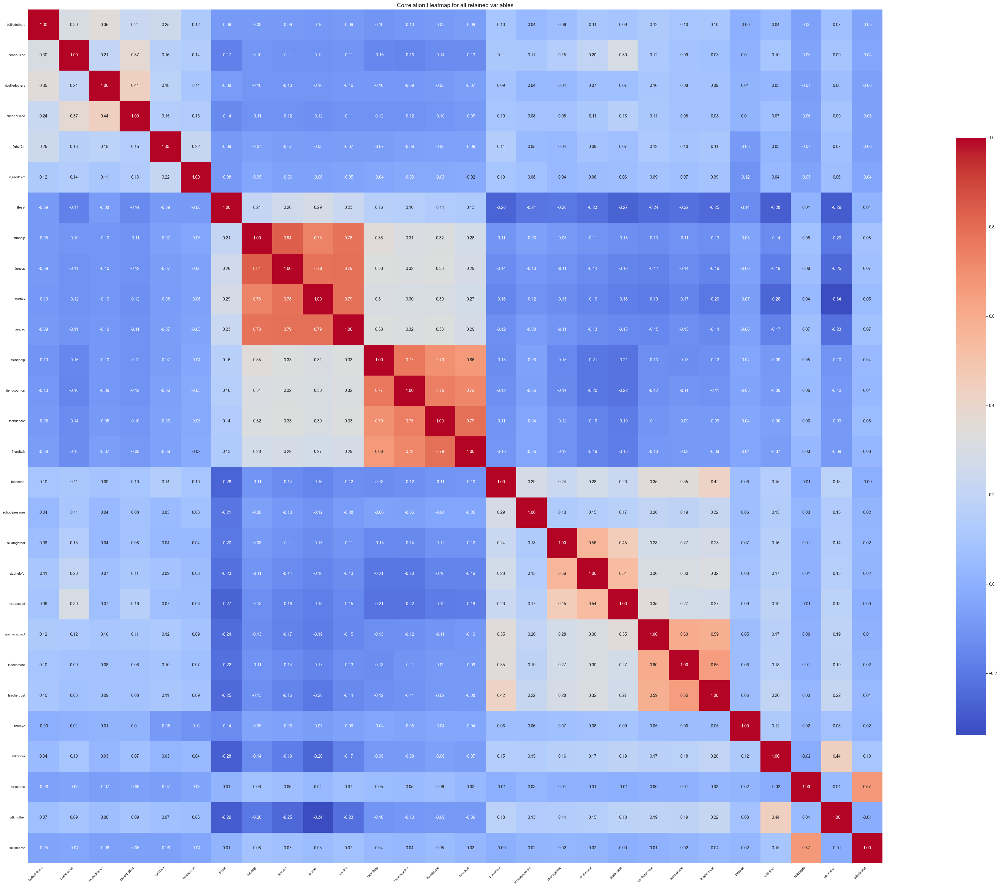

In [110]:
def plot_corr_all(df, plot_name):
    plt.clf()
    # Ensure the 'Plots' directory exists
    os.makedirs("Plots", exist_ok=True)


    corr = df.corr()
    plt.figure(figsize=(50, 30))  # Increase figure size

    sns.heatmap(
        corr,
        annot=True,
        cmap='coolwarm',
        fmt=".2f",
        square=True,
        annot_kws={"size": 10},  # Smaller annotation font
        cbar_kws={'shrink': 0.7}  # Shrink color bar
    )
    plt.title(f"Correlation Heatmap for all retained variables", fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=8)  # Rotate x labels
    plt.yticks(rotation=0, fontsize=8)  # Rotate y labels
    plt.tight_layout()
    plt.savefig(f"Plots/Correlations_{plot_name}.png")
    plt.show()

retained_data = data[retain]
plot_corr_all(retained_data, "retained with nones")


In [6]:
retain = ["bulliedothers", "beenbullied",
              "cbulliedothers", "cbeenbullied",
              "fight12m",
               "injured12m",
              "lifesat", "famhelp", "famsup", "famtalk",
              "famdec", "friendhelp", "friendcounton", "friendshare", "friendtalk",
              "likeschool", "schoolpressure", "studtogether", "studhelpful", "studaccept",
              "teacheraccept", "teachercare", "teachertrust"
              ]


In [106]:
ukraine_data = data[data["region"] == "UA"].reset_index()

In [126]:
to_drop = ["index", "HBSC",
    "seqno_int",
    "cluster",
    "countryno",
    "region",
    "id1",
    "id2",
    "id3",
    "id4",
    "weight",
    "adm",
    "month",
    "year",
    "age",
    "grade",
    "monthbirth",
    "yearbirth"]

In [127]:
ua_caus_cat = ukraine_data.drop(columns=to_drop)
to_num = ["countryborn",
    "countrybornmo",
    "countrybornfa"]

for c in to_num:
    print(ua_caus_cat[c].unique())
    ua_caus_cat[c] = ua_caus_cat[c].astype('category').cat.codes

ua_caus_cat

<StringArray>
['UA', <NA>, 'BG', 'RU', 'MD', 'IT', 'ES', 'AM', 'AZ', 'FR', 'ID', 'KZ', 'BY',
 'PL', 'IE', 'VN', 'PT', 'IL', 'GR', 'LV']
Length: 20, dtype: string
<StringArray>
['UA', 'RU', <NA>, 'BY', 'AM', 'BG', 'MD', 'KZ', 'LT', 'GE', 'LV', 'AZ', 'PL',
 'HU', 'UZ', 'KG', 'US', 'CZ', 'DE', 'TJ', 'VN', 'MN']
Length: 22, dtype: string
<StringArray>
['UA', 'KR', <NA>, 'BY', 'MD', 'RU', 'IR', 'AM', 'KZ', 'LV', 'DE', 'TM', 'SY',
 'UZ', 'AZ', 'GE', 'VN', 'ES', 'IT', 'TR', 'BG', 'HU', 'PL', 'TJ', 'IN', 'CZ',
 'LK', 'ID', 'PK', 'IL', 'KG']
Length: 31, dtype: string


,agecat,sex,fasfamcar,fasbedroom,fascomputers,fasbathroom,fasdishwash,fasholidays,health,lifesat,...,talkstepmo,famhelp,famsup,famtalk,famdec,MBMI,IRFAS,IRRELFAS_LMH,IOTF4,oweight_who
0,1.0,1.0,NaN,2.0,2.0,2.0,1.0,2.0,2.0,9.0,...,5.0,7.0,7.0,5.0,6.0,15.648687,NaN,NaN,2.0,0.0
1,1.0,1.0,2.0,2.0,3.0,3.0,1.0,1.0,2.0,7.0,...,5.0,6.0,7.0,6.0,6.0,15.614727,6.0,2.0,2.0,0.0
2,1.0,1.0,NaN,2.0,2.0,3.0,2.0,2.0,4.0,8.0,...,5.0,5.0,4.0,6.0,6.0,19.024970,NaN,NaN,2.0,1.0
3,1.0,1.0,1.0,2.0,4.0,3.0,1.0,1.0,1.0,10.0,...,3.0,7.0,7.0,7.0,7.0,15.635012,6.0,2.0,2.0,0.0
4,1.0,1.0,2.0,2.0,3.0,2.0,1.0,1.0,1.0,6.0,...,5.0,5.0,6.0,5.0,5.0,17.604748,5.0,2.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6655,3.0,2.0,2.0,2.0,3.0,2.0,1.0,1.0,3.0,6.0,...,5.0,5.0,4.0,7.0,5.0,20.957171,5.0,2.0,2.0,0.0
6656,3.0,2.0,1.0,2.0,2.0,2.0,1.0,1.0,3.0,5.0,...,5.0,7.0,7.0,6.0,7.0,19.723183,3.0,1.0,2.0,0.0
6657,3.0,2.0,1.0,1.0,3.0,2.0,2.0,4.0,3.0,6.0,...,5.0,4.0,2.0,3.0,3.0,17.288816,7.0,2.0,1.0,0.0
6658,3.0,2.0,1.0,2.0,2.0,2.0,1.0,1.0,2.0,9.0,...,5.0,5.0,4.0,4.0,4.0,17.856518,3.0,1.0,1.0,0.0


In [115]:
ukraine_data.drop(columns=to_drop)

,index,agecat,sex,grade,monthbirth,yearbirth,fasfamcar,fasbedroom,fascomputers,fasbathroom,...,talkstepmo,famhelp,famsup,famtalk,famdec,MBMI,IRFAS,IRRELFAS_LMH,IOTF4,oweight_who
0,926,1.0,1.0,NaN,10.0,2007.0,NaN,2.0,2.0,2.0,...,5.0,7.0,7.0,5.0,6.0,15.648687,NaN,NaN,2.0,0.0
1,927,1.0,1.0,NaN,10.0,2007.0,2.0,2.0,3.0,3.0,...,5.0,6.0,7.0,6.0,6.0,15.614727,6.0,2.0,2.0,0.0
2,928,1.0,1.0,NaN,10.0,2007.0,NaN,2.0,2.0,3.0,...,5.0,5.0,4.0,6.0,6.0,19.024970,NaN,NaN,2.0,1.0
3,1025,1.0,1.0,NaN,9.0,2007.0,1.0,2.0,4.0,3.0,...,3.0,7.0,7.0,7.0,7.0,15.635012,6.0,2.0,2.0,0.0
4,1026,1.0,1.0,NaN,9.0,2007.0,2.0,2.0,3.0,2.0,...,5.0,5.0,6.0,5.0,5.0,17.604748,5.0,2.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6655,244059,3.0,2.0,NaN,11.0,2001.0,2.0,2.0,3.0,2.0,...,5.0,5.0,4.0,7.0,5.0,20.957171,5.0,2.0,2.0,0.0
6656,244060,3.0,2.0,NaN,11.0,2001.0,1.0,2.0,2.0,2.0,...,5.0,7.0,7.0,6.0,7.0,19.723183,3.0,1.0,2.0,0.0
6657,244061,3.0,2.0,NaN,11.0,2001.0,1.0,1.0,3.0,2.0,...,5.0,4.0,2.0,3.0,3.0,17.288816,7.0,2.0,1.0,0.0
6658,244062,3.0,2.0,NaN,12.0,2001.0,1.0,2.0,2.0,2.0,...,5.0,5.0,4.0,4.0,4.0,17.856518,3.0,1.0,1.0,0.0


<Figure size 640x480 with 0 Axes>

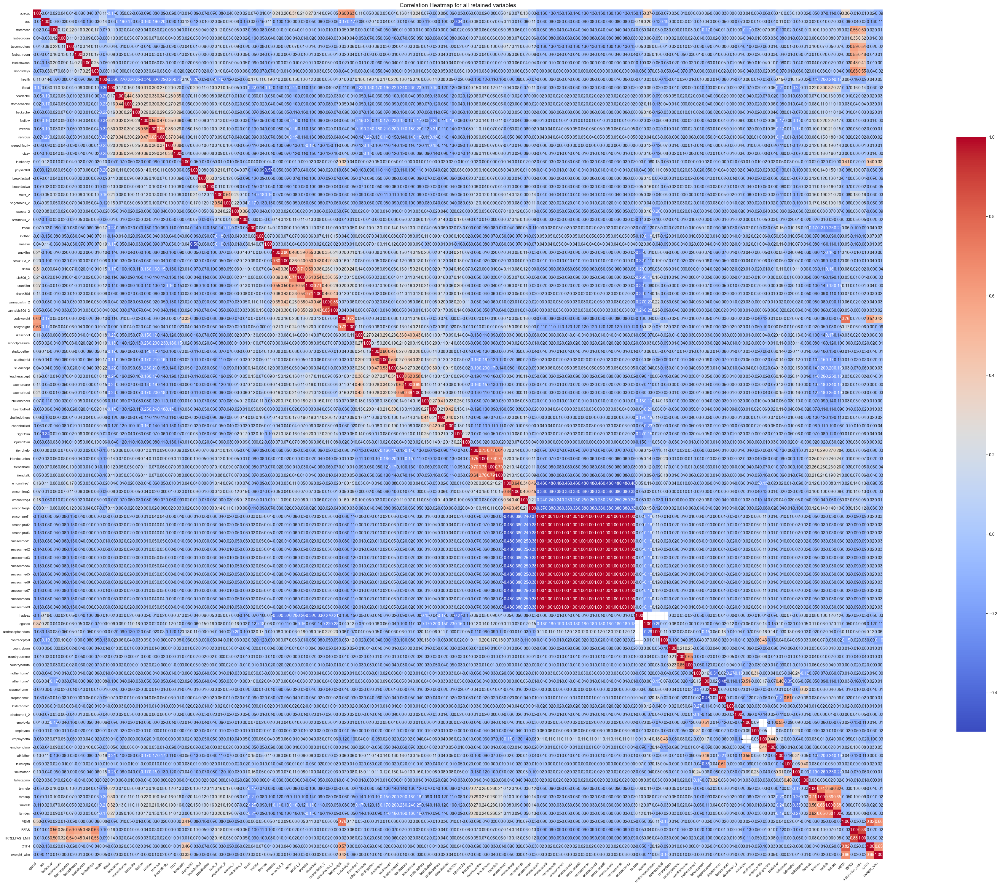

In [128]:
plot_corr_all(ua_caus_cat, "ukrainedata")

In [109]:
for col in ukraine_data:
    print(col, ukraine_data[col].unique())

index [   926    927    928 ... 244061 244062 244063]
HBSC [2018.]
seqno_int [4801211. 4801214. 4802132. ... 4811019. 4812196. 4812854.]
cluster [4800262. 4800460. 4800031. 4800241. 4800303. 4800353. 4800397. 4800001.
 4800013. 4800035. 4800493. 4800566. 4800643. 4800731. 4800208. 4800385.
 4800542. 4800505. 4800742. 4800584. 4800064. 4800149. 4800227. 4800251.
 4800321. 4800377. 4800404. 4800518. 4800673. 4800058. 4800113. 4800184.
 4800340. 4800560. 4800666. 4800798. 4800038. 4800052. 4800081. 4800097.
 4800109. 4800122. 4800151. 4800155. 4800166. 4800193. 4800271. 4800293.
 4800298. 4800343. 4800345. 4800382. 4800389. 4800407. 4800420. 4800477.
 4800479. 4800516. 4800521. 4800499. 4800606. 4800617. 4800628. 4800640.
 4800714. 4800721. 4800747. 4800777. 4800782. 4800788. 4800799. 4800805.
 4800810. 4800816. 4800102. 4800670. 4800091. 4800146. 4800158. 4800178.
 4800199. 4800248. 4800288. 4800372. 4800432. 4800456. 4800549. 4800568.
 4800580. 4800307. 4800061. 4800134. 4800237. 480025

In [104]:
description = ukraine_data.describe()
empties = ukraine_data.isna().sum()
empties = pd.DataFrame(empties, columns = ["nulls"])
empties = empties.transpose()
stats = pd.concat([description, empties])
t4 = stats.transpose()
t4 = t4.dropna().round(3)
t4[["count", "nulls"]] = t4[["count", "nulls"]].astype("int")

label = "ukraine_describe_dataset"
caption = "Major metrics for Ukraine subset of the HBSC data with counds of missing entries for each feature."
df_to_tex(t4, label = label, caption = caption)

,count,mean,std,min,25%,50%,75%,max,nulls
index,6660,121511.616,69250.771,926.0,62000.750,123923.500,180681.250,244063.000,0
HBSC,6660,2018.000,0.000,2018.0,2018.000,2018.000,2018.000,2018.000,0
seqno_int,6660,4806220.588,3804.041,4800001.0,4802964.000,4806036.500,4809195.500,4813535.000,0
cluster,6660,4800423.070,238.408,4800001.0,4800217.000,4800426.000,4800627.000,4800817.000,0
countryno,6660,804000.000,0.000,804000.0,804000.000,804000.000,804000.000,804000.000,0
...,...,...,...,...,...,...,...,...,...
MBMI,5981,18.918,3.497,0.0,16.666,18.591,20.701,43.905,679
IRFAS,6166,5.638,2.340,0.0,4.000,5.000,7.000,13.000,494
IRRELFAS_LMH,6166,2.026,0.609,1.0,2.000,2.000,2.000,3.000,494
IOTF4,5962,1.958,0.591,1.0,2.000,2.000,2.000,4.000,698


In [11]:
retain = ["bulliedothers", "beenbullied",
              "cbulliedothers", "cbeenbullied",
              "fight12m",
              "injured12m",
              "lifesat", "famhelp", "famsup", "famtalk",
              "famdec", "friendhelp", "friendcounton", "friendshare", "friendtalk",
              "likeschool", "schoolpressure", "studtogether", "studhelpful", "studaccept",
              "teacheraccept", "teachercare", "teachertrust","timeexe", "talkfather", "talkstepfa", "talkmother", "talkstepmo"
              #"IRFAS"
              ]



for col in data[retain].columns:
    print(col, data[col].unique())


bulliedothers [ 2.  5.  1.  4.  3. nan]
beenbullied [ 1.  2.  4.  3.  5. nan]
cbulliedothers [ 5.  1.  2.  4. nan  3.]
cbeenbullied [ 3.  2.  1. nan  5.  4.]
fight12m [ 2.  1.  3. nan  4.  5.]
injured12m [ 2.  1.  5.  4. nan  3.]
lifesat [ 7. 10. nan  6.  8.  5.  9.  4.  3.  1.  0.  2.]
famhelp [ 7.  2. nan  1.  4.  6.  3.  5.]
famsup [ 6.  7.  1. nan  3.  4.  2.  5.]
famtalk [ 7.  1. nan  5.  4.  6.  2.  3.]
famdec [ 5.  7.  1. nan  6.  2.  4.  3.]
friendhelp [ 7.  5.  3. nan  4.  1.  6.  2.]
friendcounton [ 6.  1.  7.  3. nan  2.  4.  5.]
friendshare [ 7.  5. nan  1.  2.  3.  4.  6.]
friendtalk [ 5.  7.  1.  6. nan  2.  4.  3.]
likeschool [ 1.  2.  4. nan  3.]
schoolpressure [ 1.  3.  2.  4. nan]
studtogether [ 2.  1.  5.  3. nan  4.]
studhelpful [ 1.  2.  3.  4.  5. nan]
studaccept [ 1.  3.  2.  5. nan  4.]
teacheraccept [ 1.  2.  5.  3. nan  4.]
teachercare [ 1.  2.  4.  5.  3. nan]
teachertrust [ 1.  2.  4.  5.  3. nan]
timeexe [ 3.  2.  6.  4.  1. nan  5.  7.]
talkfather [ 1.  2.

In [24]:
data["IRFAS"].unique()113

array([ 6., nan,  4.,  5.,  8.,  9.,  1.,  3., 11.,  2.,  0.,  7., 10.,
       12., 13.])

In [23]:
irfun = data[["IRFAS", "IRRELFAS_LMH"]].groupby(["IRRELFAS_LMH"]).agg(['unique']).reset_index()
lable = "IRFAS_IRRELFAS_uniq"
caption = "Relative Family Affluence Score(categorical) and corresponding discrete FAS III"
df_to_tex(irfun, label=lable, caption=caption)



LaTeX table with caption below saved to C:/Users/dnedi/PycharmProjects/CausalDiscoveryProject/Report/final_report/tables/IRFAS_IRRELFAS_uniq.tex


In [19]:
wm = lambda x: np.average(x, weights=df.loc[x.index, "weight"])

In [18]:
ukraine_data.weight

0       1.00000
1       1.00000
2       1.00000
3       1.00000
4       1.00000
         ...   
6655    0.97664
6656    0.97664
6657    0.97664
6658    0.97664
6659    0.97664
Name: weight, Length: 6660, dtype: float64

In [74]:
from sklearn.utils.extmath import weighted_mode

lux_data = data[data["region"] == "LU"].reset_index()

ifas_pr_region = data.groupby('region').apply(lambda x: pd.Series({
    'IRFAS': (x['IRFAS'] * x['weight']).sum() / x['weight'].sum(),
    'IRRELFAS_LMH': weighted_mode(x['IRRELFAS_LMH'],x['weight'])[0][0],
    'IRRELFAS_LMH_COUNTS': x['IRRELFAS_LMH'].value_counts(normalize=True).round(2).to_dict()
})).reset_index()
ifas_pr_region.columns = ["region", "IRFAS", "IRRELFAS_LMH", "IRRELFAS_LMH_COUNTS"]
sorted_ifas = ifas_pr_region.sort_values(by='IRFAS', ascending=False)

pd.DataFrame()

C:\Users\dnedi\AppData\Local\Temp\ipykernel_11356\1781639913.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ifas_pr_region = data.groupby('region').apply(lambda x: pd.Series({


""


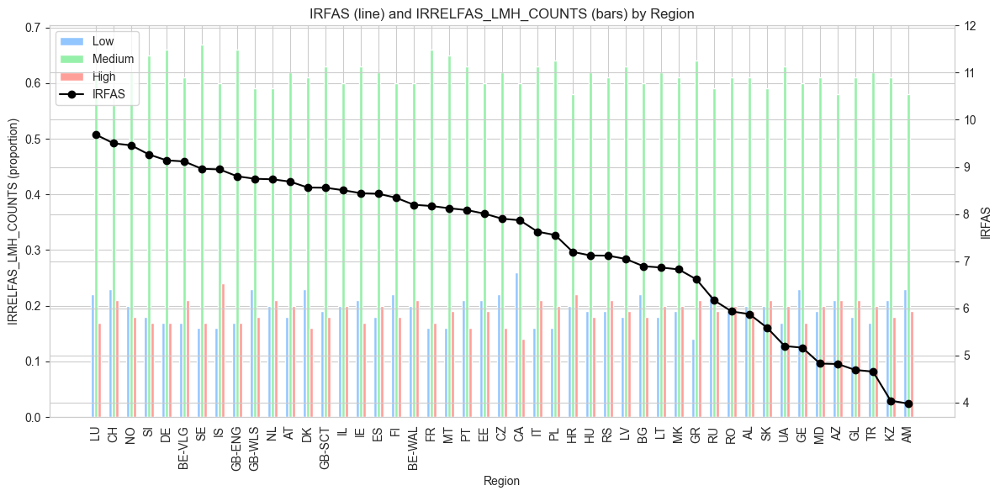

Image moved to: C:/Users/dnedi/PycharmProjects/CausalDiscoveryProject/Report/final_report/pictures/IRFASvsIRRELFAS.png
LaTeX code saved to: C:/Users/dnedi/PycharmProjects/CausalDiscoveryProject/Report/final_report/pictures/IRFASvsIRRELFAS.tex


In [84]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data from your screenshot
regions = sorted_ifas["region"]
IRFAS = sorted_ifas["IRFAS"]
count_1 = sorted_ifas['IRRELFAS_LMH_COUNTS'].apply(lambda d: d.get(1.0, 0))
count_2 = sorted_ifas['IRRELFAS_LMH_COUNTS'].apply(lambda d: d.get(2.0, 0))
count_3 = sorted_ifas['IRRELFAS_LMH_COUNTS'].apply(lambda d: d.get(3.0, 0))

x = np.arange(len(regions))
width = 0.2

fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar plots for each count
rects1 = ax1.bar(x - width, count_1, width, label='Low')
rects2 = ax1.bar(x, count_2, width, label='Medium')
rects3 = ax1.bar(x + width, count_3, width, label='High')

ax1.set_xlabel('Region')
ax1.set_ylabel('IRRELFAS_LMH_COUNTS (proportion)')
ax1.set_xticks(x)
ax1.set_xticklabels(regions, rotation=90)

# Line plot for IRFAS on secondary y-axis
ax2 = ax1.twinx()
line1, = ax2.plot(x, IRFAS, color='black', marker='o', label='IRFAS')
ax2.set_ylabel('IRFAS')
ax2.set_ylim(top = 12)

# Combine legends
bars = [rects1, rects2, rects3]
lines = [line1]
ax1.legend(bars + lines, [b.get_label() for b in bars] + [l.get_label() for l in lines], loc='upper left')

plt.title('IRFAS (line) and IRRELFAS_LMH_COUNTS (bars) by Region')
plt.tight_layout()
name = "IRFASvsIRRELFAS"
path = f"C:/Users/dnedi/PycharmProjects/CausalDiscoveryProject/Project/Plots/{name}.png"
plt.savefig(path)
plt.show()

caption = "Comparison of weighted average Family Affluence Score (IRFAS, black line) and the distribution of relative family affluence categories (Low, Medium, High; colored bars) across regions. Regions are ordered by descending IRFAS. The left y-axis shows the proportion of each affluence category, while the right y-axis displays the average IRFAS"

picture_to_tex(path, caption=caption, label = name)


In [ ]:
counts = data["region"].value_counts().reset_index()
counts.columns = ["region", "count"]

ifas_pr_region = ifas_pr_region.merge(counts, on="region")

df_sorted = ifas_pr_region.sort_values(by='IRFAS', ascending=False)
df_sorted_gr = df_sorted.copy()
df_sorted_gr["IRFAS"] = df_sorted_gr["IRFAS"].astype(int)

In [60]:
region_sorted_group = df_sorted_gr.groupby(["IRFAS"]).agg(['unique']).reset_index()


region_sorted_group.columns = [col[0] for col in region_sorted_group.columns]
region_sorted_group.columns = ["WAvg IRFAS", "Regions", "WMode IRRELFAS", "counts"]
region_sorted_group = region_sorted_group.drop(region_sorted_group.columns[-1], axis = 1)
# region_sorted_group.columns()

In [62]:
region_sorted_group

,WAvg IRFAS,Regions,WMode IRRELFAS
0,3,[AM],[2.0]
1,4,"[MD, AZ, GL, TR, KZ]",[2.0]
2,5,"[RO, AL, SK, UA, GE]",[2.0]
3,6,"[BG, LT, MK, GR, RU]",[2.0]
4,7,"[CZ, CA, IT, PL, HR, HU, RS, LV]",[2.0]
5,8,"[SE, IS, GB-ENG, GB-WLS, NL, AT, DK, GB-SCT, I...",[2.0]
6,9,"[LU, CH, NO, SI, DE, BE-VLG]",[2.0]


In [61]:
label = 'weighted_mode_IRFAS'
caption = 'Rounded weighted average IRFAS(FAS III score) and corresponding weighted mode calculated based on the IRRELFAS(Relative FAS) column for each region'
df_to_tex(region_sorted_group,label = label, caption = caption)

LaTeX table with caption below saved to C:/Users/dnedi/PycharmProjects/CausalDiscoveryProject/Report/final_report/tables/weighted_mode_I.tex


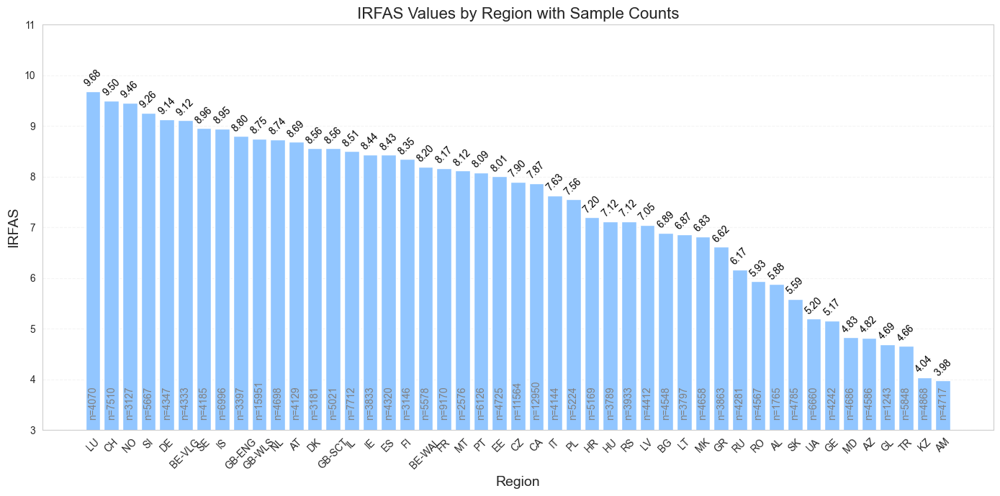

Image moved to: C:/Users/dnedi/PycharmProjects/CausalDiscoveryProject/Report/final_report/pictures/IRFAS_histogram.png
LaTeX code saved to: C:/Users/dnedi/PycharmProjects/CausalDiscoveryProject/Report/final_report/pictures/IRFAS_histogram.tex


In [63]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))
bars = plt.bar(df_sorted['region'], df_sorted['IRFAS'], )

# Annotate each bar with both IRFAS and count
for bar, irfas, count in zip(bars, df_sorted['IRFAS'], df_sorted['count']):
    height = bar.get_height()

    # Show IRFAS value just above the bar
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.05, f'{irfas:.2f}',
             ha='center', va='bottom', fontsize=10, color='black', rotation = 45)

    # Show count a bit higher above the IRFAS value
    plt.text(bar.get_x() + bar.get_width() / 2, 3.2, f'n={count}',
             ha='center', va='bottom', fontsize=10, color='gray', rotation = 90)

plt.title('IRFAS Values by Region with Sample Counts', fontsize = 16)
plt.xlabel('Region', fontsize = 14)
plt.ylabel('IRFAS', fontsize = 14)
plt.xticks(rotation=45)
plt.ylim(bottom=3, top = 11)
plt.grid(axis='y', linestyle='--', alpha=0.2)
plt.grid(axis='x', alpha=0)
plt.tight_layout()
name = "IRFAS_histogram"
path = f"C:/Users/dnedi/PycharmProjects/CausalDiscoveryProject/Project/Plots/{name}.png"
plt.savefig(path)
plt.show()

caption = "Average IRFAS score by region. The black number indicates the IRFAS score, while the grey number (n=) represents the sample size for each region."

picture_to_tex(path, caption=caption, label = name)



In [68]:
weighted_counts = (
    data.groupby(['region', 'beenbullied'])['weight']
    .count()
    .reset_index(name='weighted_count')
)

# Step 2 (Optional): Pivot to wide format for easier visualization
pivot_table = weighted_counts.pivot(index='region', columns='beenbullied', values='weighted_count').fillna(0)
pivot_table.columns = [f'Freq_{int(col)}' for col in pivot_table.columns]
pivot_table.reset_index(inplace=True)

print(pivot_table)

    region  Freq_1  Freq_2  Freq_3  Freq_4  Freq_5
0       AL    1345     279      46      32      28
1       AM    3367     449     102     119      66
2       AT    3149     542     107      92     160
3       AZ    3263     752     344      76     100
4   BE-VLG    3393     480     114      75     118
5   BE-WAL    4038     791     152      95     182
6       BG    2964     838     235     166     345
7       CA    7018    2987     895     596     604
8       CZ    9228    1222     320     219     273
9       DE    3317     512     124     106     155
10      DK    2571     361      58      50      51
11      EE    3054     956     286     160     249
12      ES    3842     340      55      30      42
13      FI    2252     524     144      91      76
14      FR    7393     962     179     117     197
15  GB-ENG    1979     683     173     123     149
16  GB-SCT    3111    1095     307     163     225
17  GB-WLS    8983    2886     711     493     754
18      GE    3371     573     

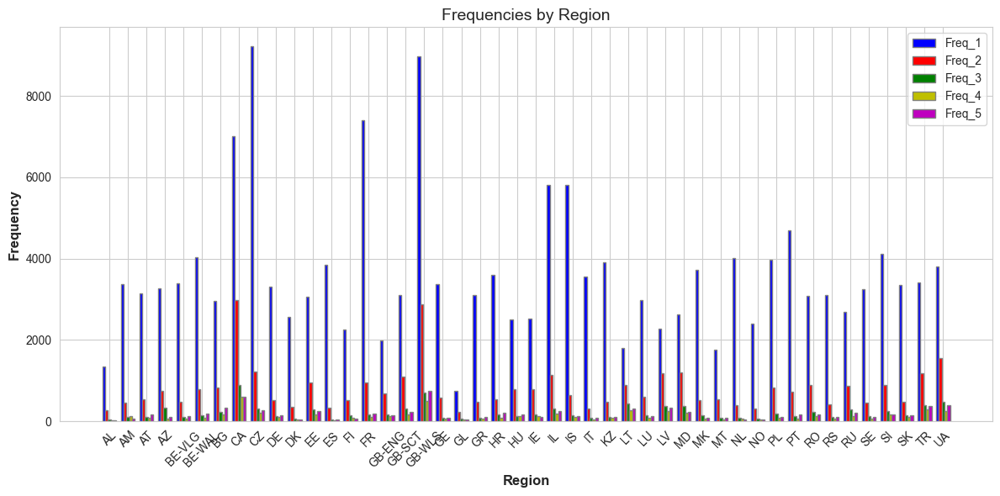

In [71]:
df = pivot_table

bar_width = 0.15
r = np.arange(len(df['region']))

# Plot
plt.figure(figsize=(12,6))

plt.bar(r, df['Freq_1'], color='b', width=bar_width, edgecolor='grey', label='Freq_1')
plt.bar(r + bar_width, df['Freq_2'], color='r', width=bar_width, edgecolor='grey', label='Freq_2')
plt.bar(r + bar_width*2, df['Freq_3'], color='g', width=bar_width, edgecolor='grey', label='Freq_3')
plt.bar(r + bar_width*3, df['Freq_4'], color='y', width=bar_width, edgecolor='grey', label='Freq_4')
plt.bar(r + bar_width*4, df['Freq_5'], color='m', width=bar_width, edgecolor='grey', label='Freq_5')

# Labels and ticks
plt.xlabel('Region', fontweight='bold', fontsize=12)
plt.ylabel('Frequency', fontweight='bold', fontsize=12)
plt.xticks(r + bar_width*2, df['region'], rotation = 45)
plt.title('Frequencies by Region', fontsize=14)
plt.legend()

plt.tight_layout()
plt.show()

### Analysis general

In [4]:
retain = ["sex", "agecat", "IRFAS",
          #"IRRELFAS_LMH",
          "IOTF4",         "emcsocmed1", "emcsocmed2", "emcsocmed3", "emcsocmed4", "emcsocmed5", "emcsocmed6", "emcsocmed7", "emcsocmed8", "emcsocmed9",         "likeschool", "schoolpressure", "studtogether", "studhelpful", "studaccept",
        "teacheraccept", "teachercare", "teachertrust",        "bulliedothers", "beenbullied", "cbulliedothers", "cbeenbullied", "fight12m", "injured12m",        "emconlfreq1", "emconlfreq2", "emconlfreq3", "emconlfreq4",
        "emconlpref1", "emconlpref2", "emconlpref3",        "friendhelp", "friendcounton", "friendshare", "friendtalk", "famhelp", "famsup", "famtalk", "famdec",
        "talkfather", "talkstepfa", "talkmother", "talkstepmo", "timeexe",        "health", "lifesat", "headache", "stomachache", "backache", "feellow", "irritable", "nervous",
        "sleepdificulty", "dizzy", "thinkbody","motherhome1", "fatherhome1", "stepmohome1", "stepfahome1", "fosterhome1", "elsehome1_2",
        "employfa", "employmo", "employnotfa", "employnotmo", "fasfamcar",    "fasbedroom",    "fascomputers",    "fasbathroom",    "fasdishwash",    "fasholidays"]

retain_dict = {
    "demographics": [
        "sex", "agecat"
    ],
    "family_affluence_indices": [
        "IRFAS", #"IRRELFAS_LMH"
    ],
    "family_affluence_vars": [
        "fasfamcar", "fasbedroom", "fascomputers", "fasbathroom", "fasdishwash","fasholidays"
    ],
    "anthropometric_indices": [
        "IOTF4"
    ],
    "digital_communication": [
        "emcsocmed1", "emcsocmed2", "emcsocmed3", "emcsocmed4", "emcsocmed5", "emcsocmed6", "emcsocmed7", "emcsocmed8", "emcsocmed9"
    ],
    "school_environment": [
        "likeschool", "schoolpressure", "studtogether", "studhelpful", "studaccept",
        "teacheraccept", "teachercare", "teachertrust"
    ],
    "bullying_violence": [
        "bulliedothers", "beenbullied", "cbulliedothers", "cbeenbullied", "fight12m", "injured12m"
    ],
    "digital_contact_frequency": [
        "emconlfreq1", "emconlfreq2", "emconlfreq3", "emconlfreq4"
    ],
    "digital_contact_preference": [
        "emconlpref1", "emconlpref2", "emconlpref3"
    ],
    "friend_support": [
        "friendhelp", "friendcounton", "friendshare", "friendtalk",
    ],
    "family_support": [
        "famhelp", "famsup", "famtalk", "famdec"
    ],
    "mom_support": [
        "talkmother", "talkstepmo"
    ],
    "father_support": [
        "talkfather", "talkstepfa"
    ],
    "health_behaviors": [
        "timeexe"
    ],
    "mental_health": [
        "lifesat", "feellow", "irritable", "nervous", "thinkbody"
    ],
    "physical_health": [
        "health", "headache", "stomachache", "backache","sleepdificulty", "dizzy"
    ],
    "family_structure": [
        "motherhome1", "fatherhome1", "stepmohome1", "stepfahome1", "fosterhome1", "elsehome1_2"
    ],
    "family_employment": [
        "employfa", "employmo", "employnotfa", "employnotmo"
    ]
}




In [6]:
print("Dataset size is ", data.shape)
print("Retaine dataset size is ", retained_data.shape)

Dataset size is  (244097, 120)
Retaine dataset size is  (244097, 74)


Найпростіший варіант це випилити усі які є з порожніми місцями. Те що інконсістент(-99 або 99) можна заповнити. Нам важливо запустити ПС для фічер селекшону

In [7]:
par_sup = retained_data[retain_dict["mom_support"]+retain_dict["father_support"]].dropna( how='all').fillna(0).astype('int32')

mor_sup = pd.pivot_table(
    par_sup,
    index=retain_dict["mom_support"][0],  # rows (can be a list of columns)
    columns=retain_dict["mom_support"][1],                         # columns in pivot
    aggfunc='size',                         # counts (change to 'mean' or other agg funcs as needed)
    fill_value=0                           # fill missing with 0
)


far_sup = pd.pivot_table(
    par_sup,
    index=retain_dict["father_support"][0] , # rows (can be a list of columns)
    columns=retain_dict["father_support"][1],                         # columns in pivot
    aggfunc='size',                         # counts (change to 'mean' or other agg funcs as needed)
    fill_value=0                           # fill missing with 0
)


far_sup['Total'] = far_sup.sum(axis=1)
far_sup.loc['Total'] = far_sup.sum(axis=0)
mor_sup['Total'] = mor_sup.sum(axis=1)
mor_sup.loc['Total'] = mor_sup.sum(axis=0)

print(far_sup)
print("")
print(mor_sup)

from utilities.utils import df_to_tex


caption = 'Crosstabulation of responses to how easy it is for respondents to talk to their father and stepfather about things that really bother them.'

latex_far_sup = df_to_tex(far_sup, label="father_stepfather_support_pivot", caption=caption)

caption = 'Crosstabulation of responses to how easy it is for respondents to talk to their mother and stepmother about things that really bother them. Values represent the number of respondents selecting each pair of response categories. Responses range from 1 (Very easy) to 4 (Very difficult), reflecting increasing difficulty. The values 0 and 5 represent non-substantive responses: 0 indicates a missing response, and 5 corresponds to "Dont have or see" the person in question.'
latex_mor_sup = df_to_tex(mor_sup, label = "mother_stepmother_support_pivot", caption = caption)



talkstepfa      0     1      2      3     4       5   Total
talkfather                                                 
0            2712   267    389    252   146    1487    5253
1           20628  4954   2997   2028  1247   41923   73777
2           18105   944   4816   3012  1582   49887   78346
3            7975   503   1438   3269  1627   25477   40289
4            3322   302    599    679  2714   11394   19010
5            2045   921   1661   1087  1311    8159   15184
Total       54787  7891  11900  10327  8627  138327  231859

talkstepmo      0     1     2     3     4       5   Total
talkmother                                               
0            1749   188   226   149    69     902    3283
1           30505  5116  3667  3092  2487   71032  115899
2           17244   671  3755  2570  1926   48747   74913
3            4830   340   608  1913  1107   15244   24042
4            1728   181   250   217  1622    5278    9276
5             712   368   358   200   203    2605    

general data summary - columns

In [9]:
import json

with open('variable_categories.json', 'r', encoding='utf-8') as f:
    category_dict = json.load(f)

# Step 2: Convert the dictionary to a DataFrame
df_summary = pd.DataFrame([
    {"Category": cat, "Variables": ", ".join(vars)}
    for cat, vars in category_dict.items()
])


df = df_summary.set_index(df_summary["Category"])
df = df.drop(columns = ["Category"])
df

,Variables
Category,
Demographics & Metadata,"HBSC, seqno_int, cluster, countryno, region, i..."
Family Affluence Scale,"fasfamcar, fasbedroom, fascomputers, fasbathro..."
Health & Well-being,"health, lifesat, MBMI, IOTF4, oweight_who"
Somatic Symptoms,"headache, stomachache, backache, feellow, irri..."
Health Behaviors,"physact60, timeexe, breakfastwd, breakfastwe, ..."
Body Measures,"bodyweight, bodyheight"
School Experience,"likeschool, schoolpressure, studtogether, stud..."
Violence and Bullying,"bulliedothers, beenbullied, cbulliedothers, cb..."
Peer Support,"friendhelp, friendcounton, friendshare, friend..."


In [10]:
caption = "Summary table of variables from the HBSC dataset, where each variable is assigned to a category depending on the data it represents"
df_to_tex(df, label="hbsc_variables_groups", caption = caption)

C:/Users/dnedi/PycharmProjects/CausalDiscoveryProject/Report/final_report/tables/hbsc_variables_groups.tex
LaTeX table with caption below saved to C:/Users/dnedi/PycharmProjects/CausalDiscoveryProject/Report/final_report/tables/hbsc_variables_groups.tex


In [11]:
retain = ["bulliedothers", "beenbullied",
            # "cbulliedothers", "cbeenbullied",
              "fight12m",
                # "injured12m",
              "lifesat",
            "famhelp",
          "famsup",
          "famtalk",
              "famdec",
          "friendhelp", "friendcounton", "friendshare", "friendtalk",
              "likeschool", "schoolpressure", "studtogether", "studhelpful", "studaccept",
              "teacheraccept", "teachercare", "teachertrust"
              ]

retained_samples = data[retain]

In [13]:
retained_samples.shape

(244097, 20)

In [15]:
retained_samples.dropna().shape

(182342, 20)

In [57]:
retained_samples[(retained_samples == 99).any(axis=1) | (retained_samples == -99).any(axis=1)].dropna()

,bulliedothers,beenbullied,fight12m,lifesat,famhelp,famsup,famtalk,famdec,friendhelp,friendcounton,friendshare,friendtalk,likeschool,schoolpressure,studtogether,studhelpful,studaccept,teacheraccept,teachercare,teachertrust


### Employment ambiugity

In [25]:
#retained_data[retain_dict["family_employment"]]
mapping = {1:1, 2:2, 3:3, 4:4}
newcols = ["employnotfa_", "employnotmo_"]
retained_data["employfa"] = retained_data["employfa"].map(mapping)
retained_data["employmo"] = retained_data["employmo"].map(mapping)
retained_data["employnotfa_"] = retained_data["employnotfa"]+3
retained_data["employnotmo_"] = retained_data["employnotmo"]+3
#retained_data[retain_dict["family_employment"] + newcols]
#retained_data[(retained_data["employfa"] == 1) & (retained_data["employnotfa"].notna())]
retained_data[(retained_data["employfa"] == 1) & (retained_data["employnotfa"]!=4)& (retained_data["employnotfa"].notna())][retain_dict["family_employment"] + newcols]


C:\Users\dnedi\AppData\Local\Temp\ipykernel_40784\1405313968.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  retained_data["employfa"] = retained_data["employfa"].map(mapping)
C:\Users\dnedi\AppData\Local\Temp\ipykernel_40784\1405313968.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  retained_data["employmo"] = retained_data["employmo"].map(mapping)
C:\Users\dnedi\AppData\Local\Temp\ipykernel_40784\1405313968.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Data

,employfa,employmo,employnotfa,employnotmo,employnotfa_,employnotmo_
48,1.0,3.0,3.0,4.0,6.0,7.0
184,1.0,1.0,1.0,1.0,4.0,4.0
187,1.0,1.0,1.0,1.0,4.0,4.0
284,1.0,2.0,3.0,2.0,6.0,5.0
551,1.0,1.0,1.0,1.0,4.0,4.0
...,...,...,...,...,...,...
243661,1.0,4.0,1.0,4.0,4.0,7.0
243932,1.0,1.0,1.0,2.0,4.0,5.0
243948,1.0,NaN,2.0,4.0,5.0,7.0
243949,1.0,NaN,2.0,NaN,5.0,NaN


In [26]:
# Filter data
zeroed_data_fa = retained_data[["employfa", "employnotfa"]].fillna(0)
zeroed_data_mo = retained_data[["employmo", "employnotmo"]].fillna(0)


# Create pivot table
# Example: Suppose you want to aggregate by one column and summarize by counts or mean of another
pivotfa = pd.pivot_table(
    zeroed_data_fa,
    index="employfa",  # rows (can be a list of columns)
    columns="employnotfa",                         # columns in pivot
    aggfunc='size',                         # counts (change to 'mean' or other agg funcs as needed)
    fill_value=0                           # fill missing with 0
)



pivotmo = pd.pivot_table(
    zeroed_data_mo,
    index="employmo",  # rows (can be a list of columns)
    columns="employnotmo",                         # columns in pivot
    aggfunc='size',                         # counts (change to 'mean' or other agg funcs as needed)
    fill_value=0                           # fill missing with 0
)

pivotfa['Total'] = pivotfa.sum(axis=1)
pivotfa.loc['Total'] = pivotfa.sum(axis=0)
pivotmo['Total'] = pivotmo.sum(axis=1)
pivotmo.loc['Total'] = pivotmo.sum(axis=0)

print(pivotfa)
print("")
print(pivotmo)

latex_pivotfa = pivotfa.to_latex()
latex_pivotmo = pivotmo.to_latex()

# print(latex_pivotfa)
# print(latex_pivotmo)

with open("C:\\Users\\dnedi\\PycharmProjects\\CausalDiscoveryProject\\Report\\final_report\\tables\\pivotfa_table.tex", "w") as f:
    f.write(latex_pivotfa)

with open("C:\\Users\\dnedi\\PycharmProjects\\CausalDiscoveryProject\\Report\\final_report\\tables\\pivotmo_table.tex", "w") as f:
    f.write(latex_pivotmo)



employnotfa     0.0   1.0   2.0   3.0   4.0   Total
employfa                                           
0.0           23705   116    58    24    96   23999
1.0          190582   908   703   367  2926  195486
2.0            1689  3748  3631  1436  2437   12941
3.0            2324    62   210    52   931    3579
4.0            6224    89    48    30  1701    8092
Total        224524  4923  4650  1909  8091  244097

employnotmo     0.0   1.0   2.0    3.0   4.0   Total
employmo                                            
0.0           23606    76    86    226   141   24135
1.0          167513  1764   327    625  1981  172210
2.0            5898  3901  7049  20485  6458   43791
3.0            1512    44    89    183   360    2188
4.0            1361    33    27     42   310    1773
Total        199890  5818  7578  21561  9250  244097


Теоретичні кейси по емплойменту-
1. немає тата та матері
2. Забув відмітити\пропустив
3. Системна помилка

In [56]:
selected = retained_data[retain_dict["family_employment"]+retain_dict["family_structure"]]
selected
cols = selected.columns
cols

Index(['employfa', 'employmo', 'employnotfa', 'employnotmo', 'motherhome1',
       'fatherhome1', 'stepmohome1', 'stepfahome1', 'fosterhome1',
       'elsehome1_2'],
      dtype='object')

In [57]:
selected[(selected["employfa"] == 1)]

,employfa,employmo,employnotfa,employnotmo,motherhome1,fatherhome1,stepmohome1,stepfahome1,fosterhome1,elsehome1_2
0,1.0,1.0,NaN,NaN,1.0,1.0,2.0,2.0,2.0,2.0
1,1.0,1.0,NaN,NaN,1.0,1.0,2.0,2.0,2.0,2.0
2,1.0,2.0,NaN,1.0,1.0,1.0,2.0,2.0,2.0,2.0
3,1.0,1.0,NaN,NaN,1.0,1.0,2.0,2.0,2.0,2.0
4,1.0,1.0,NaN,NaN,1.0,1.0,2.0,2.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...
244092,1.0,2.0,NaN,2.0,1.0,1.0,2.0,2.0,2.0,2.0
244093,1.0,1.0,NaN,NaN,1.0,1.0,2.0,2.0,2.0,2.0
244094,1.0,1.0,NaN,NaN,1.0,1.0,2.0,2.0,2.0,2.0
244095,1.0,1.0,NaN,NaN,1.0,1.0,2.0,2.0,2.0,2.0


### FAS score investigation

In [52]:
retained_data[retain_dict["family_affluence_indices"]+retain_dict["family_affluence_vars"]]

,IRFAS,fasfamcar,fasbedroom,fascomputers,fasbathroom,fasdishwash,fasholidays
0,6.0,2.0,2.0,3.0,2.0,2.0,1.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,2.0,NaN,2.0,2.0,2.0,1.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
244092,9.0,2.0,1.0,4.0,2.0,2.0,4.0
244093,9.0,2.0,2.0,4.0,3.0,1.0,3.0
244094,9.0,3.0,2.0,3.0,2.0,2.0,3.0
244095,10.0,3.0,2.0,4.0,3.0,2.0,2.0


In [58]:
import json

# Convert dtypes to string for JSON serialization
dtype_str_dict = {k: str(v) for k, v in dtype_dict.items()}

with open("dtype_dict.json", "w") as f:
    json.dump(dtype_str_dict, f)

In [28]:
def pca_selected(df, cols_to_pc, new_col):
    data_array = df[cols_to_pc].to_numpy() ## CHANGE IT
    # Create PCA object with 1 component
    pca = PCA(n_components=1)

    # Fit PCA on the data
    pca.fit(data_array)

    # Transform the data (project onto the first principal component)
    data_transformed = pca.transform(data_array)

    # Print results
    print("Explained variance ratio:", pca.explained_variance_ratio_)
    print("Singular value:", pca.singular_values_)
    print("Total explained variance:", round(pca.explained_variance_ratio_.sum(), 5))

    df[new_col] = data_transformed
    df = df.drop(columns=cols_to_pc)
    return df

In [29]:
def pc_runner(df, citest = "chisq", alpha = 0.05, name = "test"):
    os.makedirs("Graphs", exist_ok=True)
    data_array = df.to_numpy()
    cg = pc(data_array,
            independence_test=citest,
            alpha=alpha, #significance level
            labels=df.columns)

    pyd = GraphUtils.to_pydot(cg.G, labels=df.columns)
    pyd.write_png(f'Graphs\\PC_{citest}_alpha_{alpha}_{name}.png')

In [46]:
import os
import numpy as np
import pandas as pd
from causallearn.search.ConstraintBased.FCI import fci
from causallearn.utils.cit import fisherz, gsq, kci, chi2, mv_fisherz
from causallearn.utils.GraphUtils import GraphUtils

def run_fci(
    data: pd.DataFrame,
    test: str = "fisherz",
    alpha: float = 0.05,
    depth: int = -1,
    max_path_length: int = -1,
    output_dir: str = "graphs"
) -> tuple:
    """
    Run FCI algorithm with specified parameters and save resulting PAG

    Parameters:
        data: Input dataframe with variables as columns
        test: Conditional independence test (fisherz/mv_fisherz/gsq/chi2/kci)
        alpha: Significance level (default: 0.05)
        depth: Search depth for adjacency (-1=unlimited)
        max_path_length: Max discriminating path length (-1=unlimited)
        output_dir: Output directory for graphs

    Returns:
        tuple: (graph, edges) from FCI results
    """
    os.makedirs(output_dir, exist_ok=True)
    data_array = data.values.astype(np.float32)

    test_map = {
        "fisherz": fisherz,
        "mv_fisherz": mv_fisherz,
        "gsq": gsq,
        "chi2": chi2,
        "kci": kci
    }

    if test not in test_map:
        raise ValueError(f"Invalid test {test}. Choose from {list(test_map.keys())}")

    # Run FCI with specified parameters
    graph, edges = fci(
        dataset=data_array,
        independence_test_method=test_map[test],
        alpha=alpha,
        depth=depth,
        max_path_length=max_path_length,
        verbose=True
    )

    # Generate visualization
    filename = f"fci_{test}_a{alpha}_d{depth}_m{max_path_length}.png"
    GraphUtils.to_pydot(graph, labels=data.columns.tolist()).write_png(
        os.path.join(output_dir, filename)
    )

    return graph, edges


In [31]:
# import numpy as np
# import os
# from causallearn.search.ConstraintBased.RFCI import rfci
# from causallearn.utils.cit import fisherz
# from causallearn.utils import GraphUtils
#
# def rfci_alternative(df, alpha=0.05, name="test"):
#     data_array = df.to_numpy().astype(np.float64)
#
#     # Run RFCI with Fisher's Z conditional independence test
#     result = rfci(data_array, fisherz, alpha=alpha)
#
#     # Get the learned PAG graph
#     graph = result.G
#     print(graph)
#
#     # Create directory if it doesn't exist
#     os.makedirs("Graphs", exist_ok=True)
#
#     # Draw and save the graph
#     GraphUtils.draw_pydot_graph(graph, labels=df.columns.tolist()).savefig(
#         f"Graphs/RFCI_alternative_alpha_{alpha}_{name}.png", bbox_inches='tight')
#
#     return graph


<Figure size 640x480 with 0 Axes>

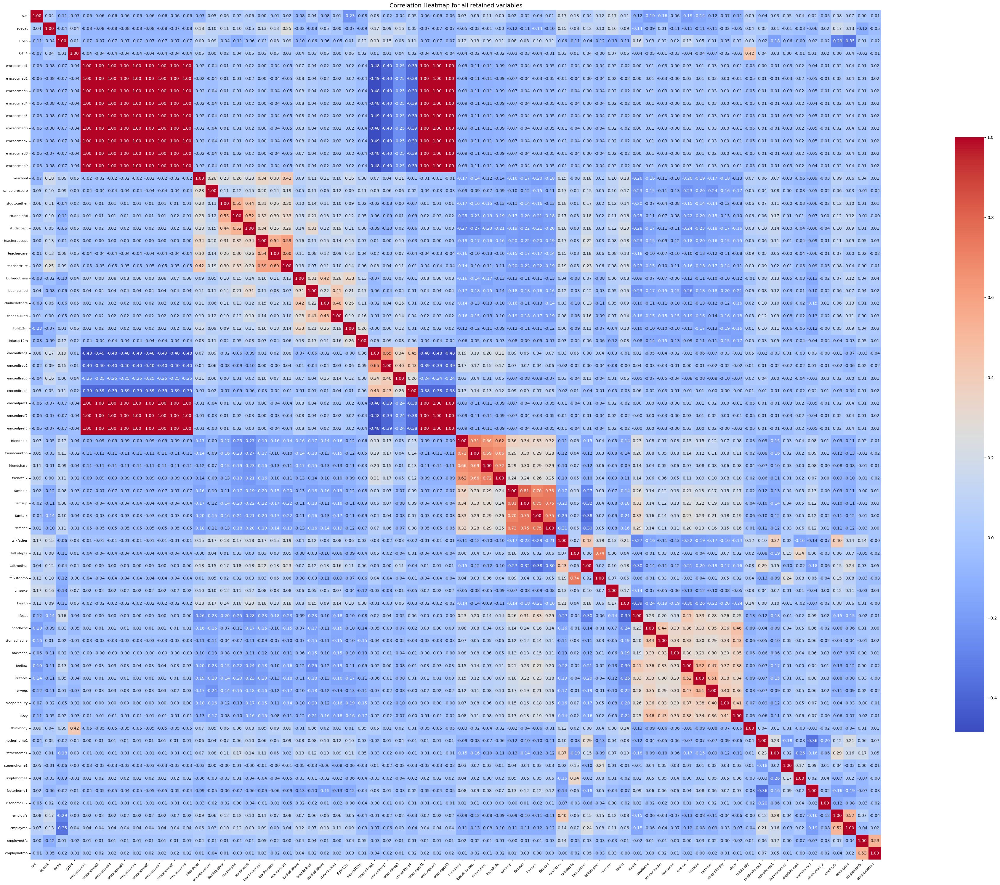

In [32]:
retained_data_nona = retained_data.dropna()
#retained_data[(retained_data != 99).any(axis=1) | (retained_data != -99).any(axis=1)].dropna()
plot_corr_all(retained_data_nona, "retained without nones")

In [33]:
cols_to_pc = retain_dict["digital_communication"]
new_name = "pc_emcsocmed"
retained_data_nona = pca_selected(retained_data_nona, cols_to_pc, new_name)
retain_dict["digital_communication"] = new_name

Explained variance ratio: [0.99980996]
Singular value: [4358.97688002]
Total explained variance: 0.99981


C:\Users\dnedi\AppData\Local\Temp\ipykernel_3612\4244222104.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[new_col] = data_transformed


In [34]:
retained_data_nona.columns

Index(['sex', 'agecat', 'IRFAS', 'IOTF4', 'likeschool', 'schoolpressure',
       'studtogether', 'studhelpful', 'studaccept', 'teacheraccept',
       'teachercare', 'teachertrust', 'bulliedothers', 'beenbullied',
       'cbulliedothers', 'cbeenbullied', 'fight12m', 'injured12m',
       'emconlfreq1', 'emconlfreq2', 'emconlfreq3', 'emconlfreq4',
       'emconlpref1', 'emconlpref2', 'emconlpref3', 'friendhelp',
       'friendcounton', 'friendshare', 'friendtalk', 'famhelp', 'famsup',
       'famtalk', 'famdec', 'talkfather', 'talkstepfa', 'talkmother',
       'talkstepmo', 'timeexe', 'health', 'lifesat', 'headache', 'stomachache',
       'backache', 'feellow', 'irritable', 'nervous', 'sleepdificulty',
       'dizzy', 'thinkbody', 'motherhome1', 'fatherhome1', 'stepmohome1',
       'stepfahome1', 'fosterhome1', 'elsehome1_2', 'employfa', 'employmo',
       'employnotfa', 'employnotmo', 'pc_emcsocmed'],
      dtype='object')

<Figure size 640x480 with 0 Axes>

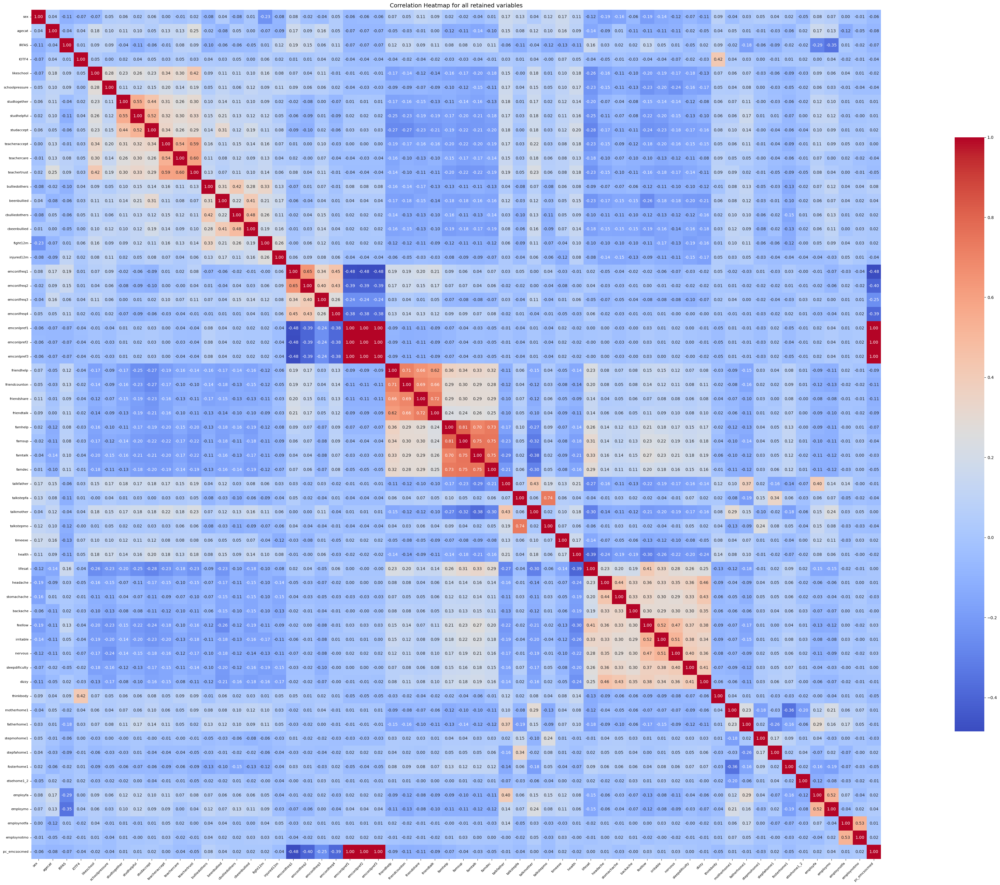

In [35]:
plot_corr_all(retained_data_nona, "pc for digital communication")

Explained variance ratio: [0.99948955]
Singular value: [2493.72504913]
Total explained variance: 0.99949


<Figure size 640x480 with 0 Axes>

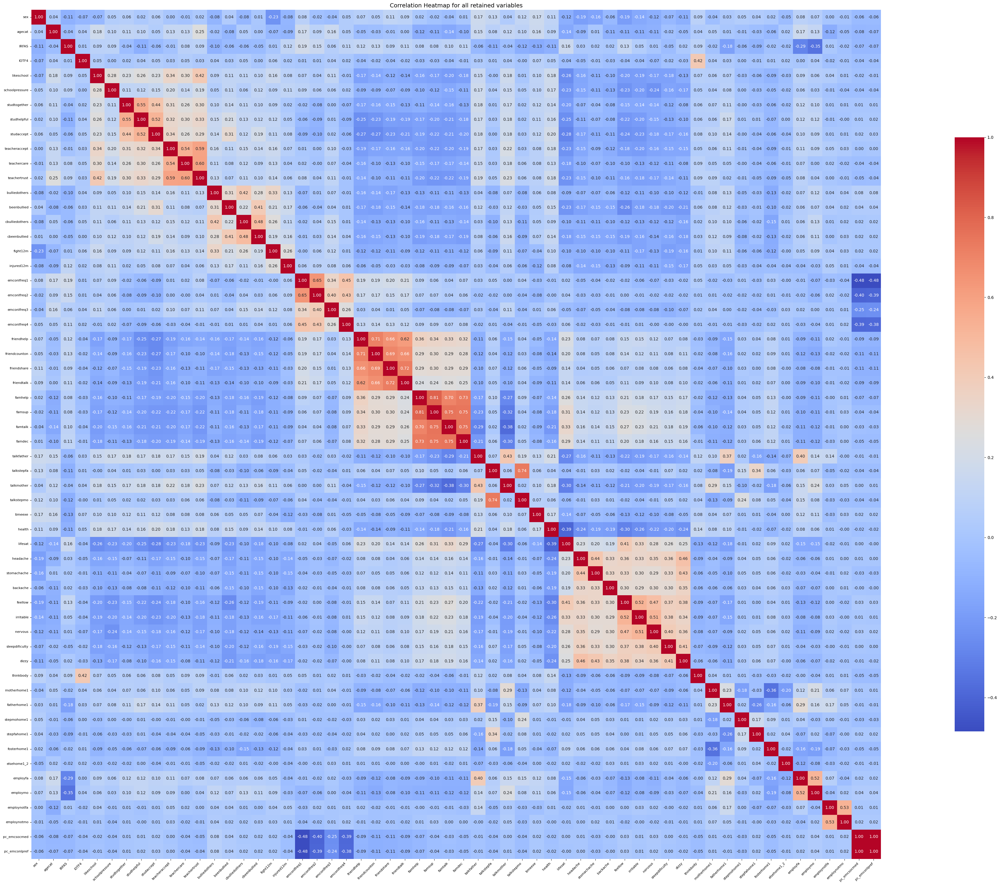

In [36]:
cols_to_pc = retain_dict["digital_contact_preference"]
new_name = "pc_emconlpref"
retained_data_nona = pca_selected(retained_data_nona, cols_to_pc, new_name)
retain_dict["digital_contact_preference"] = new_name
plot_corr_all(retained_data_nona, "pc for digital communication preferences")

Explained variance ratio: [0.57426963]
Singular value: [145.1094365]
Total explained variance: 0.57427


<Figure size 640x480 with 0 Axes>

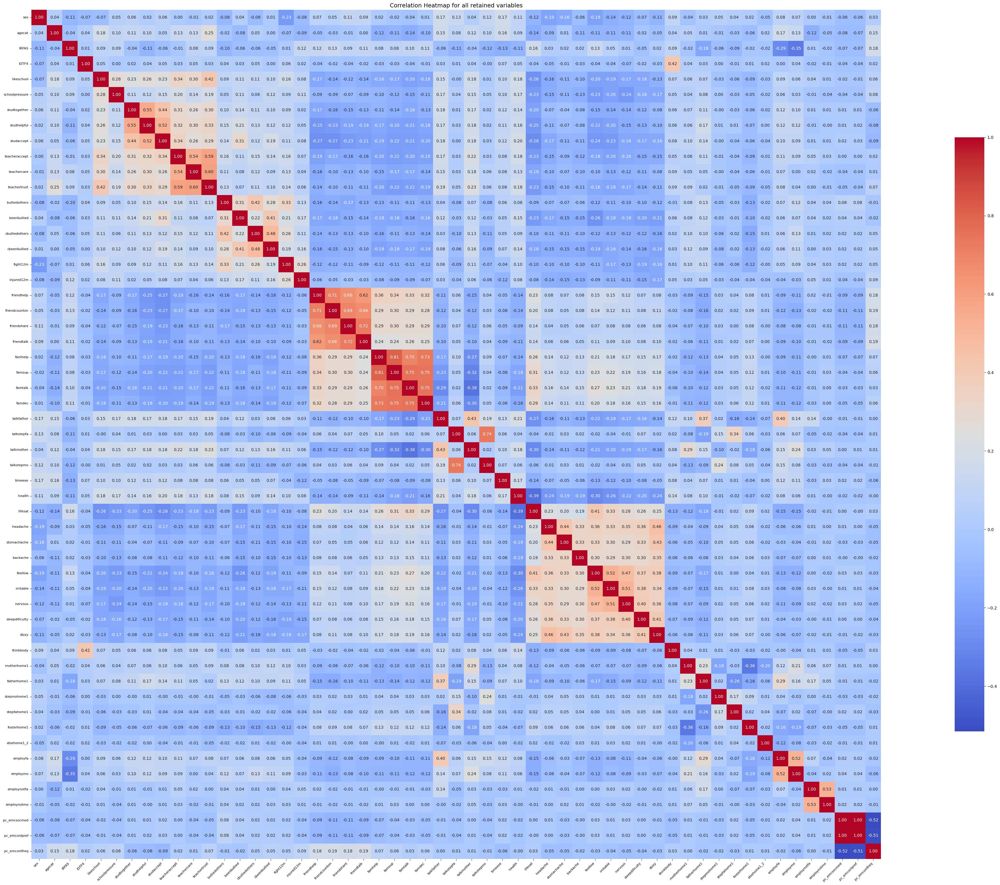

In [37]:
cols_to_pc = retain_dict["digital_contact_frequency"]
new_name = "pc_emconlfreq"
retained_data_nona = pca_selected(retained_data_nona, cols_to_pc, new_name)
retain_dict["digital_contact_frequency"] = new_name
plot_corr_all(retained_data_nona, "pc for digital all grouped")

In [38]:
retained_data_nona.shape

(3500, 55)

In [39]:
retained_data_nona.columns

Index(['sex', 'agecat', 'IRFAS', 'IOTF4', 'likeschool', 'schoolpressure',
       'studtogether', 'studhelpful', 'studaccept', 'teacheraccept',
       'teachercare', 'teachertrust', 'bulliedothers', 'beenbullied',
       'cbulliedothers', 'cbeenbullied', 'fight12m', 'injured12m',
       'friendhelp', 'friendcounton', 'friendshare', 'friendtalk', 'famhelp',
       'famsup', 'famtalk', 'famdec', 'talkfather', 'talkstepfa', 'talkmother',
       'talkstepmo', 'timeexe', 'health', 'lifesat', 'headache', 'stomachache',
       'backache', 'feellow', 'irritable', 'nervous', 'sleepdificulty',
       'dizzy', 'thinkbody', 'motherhome1', 'fatherhome1', 'stepmohome1',
       'stepfahome1', 'fosterhome1', 'elsehome1_2', 'employfa', 'employmo',
       'employnotfa', 'employnotmo', 'pc_emcsocmed', 'pc_emconlpref',
       'pc_emconlfreq'],
      dtype='object')

In [ ]:
name = "retained with no nans and +-99 pca(digital all)"
#pc_runner(retained_data.drop(columns = retain_dict["demographics"]).dropna(), name= "all data no nans", citest = "gsq")
run_fci(retained_data_nona.drop(columns = retain_dict["demographics"]))

  0%|          | 0/53 [00:00<?, ?it/s]

0 ind 1 | () with p-value 0.408940

0 dep 2 | () with p-value 0.000000

0 dep 3 | () with p-value 0.000000

0 dep 4 | () with p-value 0.013035

0 dep 5 | () with p-value 0.000000

0 dep 6 | () with p-value 0.000437

0 ind 7 | () with p-value 0.404484

0 dep 8 | () with p-value 0.000004

0 dep 9 | () with p-value 0.000000

0 dep 10 | () with p-value 0.000000

0 dep 11 | () with p-value 0.000466

0 dep 12 | () with p-value 0.000736

0 dep 13 | () with p-value 0.003119

0 ind 14 | () with p-value 0.748531

0 dep 15 | () with p-value 0.000000

0 dep 16 | () with p-value 0.000000

0 dep 17 | () with p-value 0.000000

0 dep 18 | () with p-value 0.000000

0 dep 19 | () with p-value 0.000000

0 dep 20 | () with p-value 0.000007

0 dep 21 | () with p-value 0.000002

0 dep 22 | () with p-value 0.000000

0 dep 23 | () with p-value 0.000000

0 dep 24 | () with p-value 0.000129

0 dep 25 | () with p-value 0.000000

0 dep 26 | () with p-value 0.037723

0 dep 27 | () with p-value 0.000000

0 dep 28 |

In [ ]:
import os
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from cdt.causality.graph import CGNN

def cgnn_runner(df,
                nh=20,
                nruns=16,
                njobs=1,
                gpus=True,
                batch_size=-1,
                lr=0.01,
                train_epochs=1000,
                test_epochs=1000,
                verbose=True,
                dataloader_workers=0,
                name="test"):
    """
    Run CGNN for causal discovery (continuous data only).

    Parameters:
    - df: pandas DataFrame with continuous input features.
    - All other params: as defined in CGNN docs.
    - name: for saving output.
    """

    os.makedirs("Graphs", exist_ok=True)
    data = df.copy()

    # Convert object/category columns to numeric codes
    for col in data.select_dtypes(include=["object", "category"]).columns:
        data[col] = data[col].astype("category").cat.codes

    # Ensure all columns are numeric
    if not all(data.dtypes.apply(pd.api.types.is_numeric_dtype)):
        raise ValueError("All columns must be numeric (continuous) for CGNN.")

    # Ensure no missing values
    if data.isnull().values.any():
        raise ValueError("Data contains missing values. Please clean it first.")

    # Initialize CGNN
    model = CGNN(nh=nh,
                 nruns=nruns,
                 njobs=njobs,
                 gpus=gpus,
                 batch_size=batch_size,
                 lr=lr,
                 train_epochs=train_epochs,
                 test_epochs=test_epochs,
                 verbose=verbose,
                 dataloader_workers=dataloader_workers)

    # Run CGNN to get predicted causal graph
    output_graph = model.predict(data)

    # Visualization
    plt.figure(figsize=(8, 6))
    nx.draw_networkx(output_graph,
                     labels={i: col for i, col in enumerate(df.columns)},
                     arrows=True,
                     arrowsize=20,
                     node_size=1000)
    plt.title("CGNN Discovered Causal Graph")
    plt.savefig(f"Graphs/CGNN_{name}.png", bbox_inches='tight')
    plt.close()

    return output_graph


In [ ]:
import os
from castle.algorithms import FCI
import matplotlib.pyplot as plt
import seaborn as sns

def fci_runner_gcastle(df, alpha=0.05, name="test"):
    os.makedirs("Graphs", exist_ok=True)
    data_array = df.to_numpy()
    model = FCI()
    model.learn(data_array)
    # Visualization (adjacency matrix)

    plt.figure(figsize=(8, 6))
    sns.heatmap(model.causal_matrix, annot=True, cmap="coolwarm")
    plt.title("FCI Adjacency Matrix")
    plt.savefig(f"Graphs/FCI_gcastle_alpha_{alpha}_{name}.png")
    plt.close()
    return model.causal_matrix

fci_runner_gcastle(retained_data_nona.drop(columns = retain_dict["demographics"]))

In [22]:
import sys
print(sys.maxsize > 2**32)import sys
print(sys.maxsize > 2**32)
import sys
print(sys.maxsize > 2**32)



True


In [2]:
import os
os.environ["R_HOME"] = r"C:\\Program Files\\R\\R-4.5.0"  # Replace with your R path
os.environ["PATH"] += os.pathsep + r"C:\\Program Files\\R\\R-4.5.0\\bin\\x64"

# Now import rpy2
import rpy2.robjects as ro
from rpy2.robjects.packages import importr
import rpy2.situation
for row in rpy2.situation.iter_info():
    print(row)


C:\Users\dnedi\PycharmProjects\CausalDiscoveryProject\venv\lib\site-packages\rpy2\rinterface\__init__.py:1185: UserWarning: Environment variable "PATH" redefined by R and overriding existing variable. Current: "c:/rtools45/x86_64-w64-mingw32.static.posix/bin;c:/rtools45/usr/bin;C:\Users\dnedi\PycharmProjects\CausalDiscoveryProject\venv\Scripts;C:\Program Files\Common Files\Oracle\Java\javapath;C:\Program Files (x86)\Common Files\Oracle\Java\java8path;C:\Program Files (x86)\Common Files\Oracle\Java\javapath;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.6\bin;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.6\libnvvp;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1\bin;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1\libnvvp;C:\WINDOWS\system32;C:\WINDOWS;C:\WINDOWS\System32\Wbem;C:\WINDOWS\System32\WindowsPowerShell\v1.0\;C:\WINDOWS\System32\OpenSSH\;C:\Program Files (x86)\NVIDIA Corporation\PhysX\Common;C:\Program Files\Git\cmd;C:\Program Files\Git;C:\Use

CFFI extension type
  ABI: PRESENT
  API: PRESENT
  Environment variable: RPY2_CFFI_MODE=ANY
  Loaded: CFFI_MODE.ABI
rpy2 version:
rpy2.rinterface: 3.6.0
Python version:
3.9.13 (tags/v3.9.13:6de2ca5, May 17 2022, 16:36:42) [MSC v.1929 64 bit (AMD64)]
Looking for R's HOME:
  Environment variable R_HOME: C:/PROGRA~1/R/R-45~1.0
  InstallPath in the registry: C:\Program Files\R\R-4.5.0
  Environment variable R_USER: C:\Users\dnedi\OneDrive\Documents
  Environment variable R_LIBS_USER: C:\Users\dnedi\AppData\Local/R/win-library/4.5
R version:
  In the PATH: R version 4.5.0 (2025-04-11 ucrt) -- "How About a Twenty-Six"
  Loading R library from rpy2: OK
Additional directories to load R packages from:
  None
C extension compilation:
  include:
    ['C:/PROGRA~1/R/R-45~1.0/include', 'C:/PROGRA~1/R/R-45~1.0/include/x64']
  libraries:
    ['R', 'm']
  library_dirs:
    ['C:/PROGRA~1/R/R-45~1.0/bin/x64']
  extra_compile_args:
    ['-std=c99']
  extra_link_args:
    []
  Directory for the R shared 

In [ ]:
import rpy2.robjects as ro
from rpy2.robjects.packages import importr

utils = importr('utils')
utils.install_packages('dcFCI')


In [2]:
import rpy2.robjects as ro
from rpy2.robjects.packages import importr

# Install devtools if not already installed
utils = importr('utils')
utils.install_packages('devtools')

# Now install dcFCI from GitHub
ro.r('devtools::install_github("mihaiconstantin/DC-FCI")')


Error importing in API mode: ImportError('On Windows, cffi mode "ANY" is only "ABI".')
Trying to import in ABI mode.
C:\Users\dnedi\PycharmProjects\CausalDiscoveryProject\venv\lib\site-packages\rpy2\rinterface\__init__.py:1185: UserWarning: Environment variable "PATH" redefined by R and overriding existing variable. Current: "C:\Users\dnedi\PycharmProjects\CausalDiscoveryProject\venv\Scripts;C:\Program Files\Common Files\Oracle\Java\javapath;C:\Program Files (x86)\Common Files\Oracle\Java\java8path;C:\Program Files (x86)\Common Files\Oracle\Java\javapath;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.6\bin;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.6\libnvvp;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1\bin;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1\libnvvp;C:\WINDOWS\system32;C:\WINDOWS;C:\WINDOWS\System32\Wbem;C:\WINDOWS\System32\WindowsPowerShell\v1.0\;C:\WINDOWS\System32\OpenSSH\;C:\Program Files (x86)\NVIDIA Corporation\PhysX\Common;C:\

TypeError: getattr(): attribute name must be string

In [1]:
import rpy2.robjects as ro
from rpy2.robjects.packages import importr

# Install dcFCI in R first
name = "only drop none"
dcfci = importr("dcFCI")
result = dcfci.dcFCI(data=retained_data_nona)


Error importing in API mode: ImportError('On Windows, cffi mode "ANY" is only "ABI".')
Trying to import in ABI mode.
C:\Users\dnedi\PycharmProjects\CausalDiscoveryProject\venv\lib\site-packages\rpy2\rinterface\__init__.py:1185: UserWarning: Environment variable "PATH" redefined by R and overriding existing variable. Current: "C:\Users\dnedi\PycharmProjects\CausalDiscoveryProject\venv\Scripts;C:\Program Files\Common Files\Oracle\Java\javapath;C:\Program Files (x86)\Common Files\Oracle\Java\java8path;C:\Program Files (x86)\Common Files\Oracle\Java\javapath;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.6\bin;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.6\libnvvp;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1\bin;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1\libnvvp;C:\WINDOWS\system32;C:\WINDOWS;C:\WINDOWS\System32\Wbem;C:\WINDOWS\System32\WindowsPowerShell\v1.0\;C:\WINDOWS\System32\OpenSSH\;C:\Program Files (x86)\NVIDIA Corporation\PhysX\Common;C:\

TypeError: getattr(): attribute name must be string

In [20]:
print(os.environ["PATH"])

C:\Users\dnedi\PycharmProjects\CausalDiscoveryProject\venv\Scripts;C:\Program Files\Common Files\Oracle\Java\javapath;C:\Program Files (x86)\Common Files\Oracle\Java\java8path;C:\Program Files (x86)\Common Files\Oracle\Java\javapath;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.6\bin;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.6\libnvvp;;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1\bin;C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.1\libnvvp;;C:\WINDOWS\system32;C:\WINDOWS;C:\WINDOWS\System32\Wbem;C:\WINDOWS\System32\WindowsPowerShell\v1.0\;C:\WINDOWS\System32\OpenSSH\;C:\Program Files (x86)\NVIDIA Corporation\PhysX\Common;C:\Program Files\Git\cmd;C:\Program Files\Git;C:\Users\dnedi\Downloads\Git-2.40.1-64-bit.exe;C:\Program Files\Git\bin;C:\Program Files\dotnet\;C:\Program Files\Docker\Docker\resources\bin;C:\Program Files\NVIDIA Corporation\NVIDIA app\NvDLISR;C:\Program Files\NVIDIA Corporation\Nsight Compute 2024.3.2\;C:\Program Files\Graphviz

In [ ]:
name = "only drop none"
fci_runner(retained_data.drop(columns = retain_dict["demographics"]).dropna(), name= name, citest = "gsq")

In [ ]:

for col in retained_data_nona:
    print(col.unique)

{}


{'Any': typing.Any,
 'Dict': typing.Dict,
 'List': typing.List,
 'Tuple': typing.Tuple,
 'cov_noise': <function causallearn.utils.ScoreUtils.cov_noise(logtheta=None, x=None, z=None, nargout=1)>,
 'cov_seard': <function causallearn.utils.ScoreUtils.cov_seard(loghyper=None, x=None, z=None, nargout=1)>,
 'cov_sum': <function causallearn.utils.ScoreUtils.cov_sum(covfunc, logtheta=None, x=None, z=None, nargout=1)>,
 'dist2': <function causallearn.utils.ScoreUtils.dist2(x, c)>,
 'eigdec': <function causallearn.utils.ScoreUtils.eigdec(x, N, evals_only=False)>,
 'feval': <function causallearn.utils.ScoreUtils.feval(parameters)>,
 'gpr_multi_new': <function causallearn.utils.ScoreUtils.gpr_multi_new(logtheta=None, covfunc=None, x=None, y=None, xstar=None, nargout=1)>,
 'kernel': <function causallearn.utils.ScoreUtils.kernel(x, xKern, theta)>,
 'local_score_BDeu': <function causallearn.score.LocalScoreFunction.local_score_BDeu(Data: numpy.ndarray, i: int, PAi: List[int], parameters=None) -> floa


### Почистити колонки - менше фічерс. Групувати ті, які одної категорії

# + OLD Chunks

In [ ]:
ukraine = 804000
denmark = 208000

In [ ]:
data_country = data[(data["countryno"] == ukraine) | (data["countryno"] == denmark)]

In [ ]:
print("Data sample for Ukraine is",data_country.shape)

In [ ]:
agesex = data_country[["agesex", "region"]]

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Prepare the data
stats_uadk = agesex.dropna().groupby(by="region")["agesex"]
stats_uadk_counts = stats_uadk.value_counts().reset_index(name="count")
stats_uadk_counts.columns = ["region", "agesex", "count"]

# Inner ring: total count by region
inner_data = stats_uadk_counts.groupby("region")["count"].sum()
inner_labels = inner_data.index
inner_sizes = inner_data.values

# Outer ring: counts of agesex within each region
outer_labels = stats_uadk_counts.apply(lambda row: f"{row['agesex']} ({row['region']})", axis=1)
outer_sizes = stats_uadk_counts["count"].values

# Define colors
inner_colors = plt.cm.tab20c.colors[:len(inner_labels)]
outer_colors = plt.cm.tab20.colors[:len(outer_labels)]

# Custom autopct to display both count and percent
def make_autopct(values):
    def autopct(pct):
        total = sum(values)
        val = int(round(pct * total / 100.0))
        return f"{pct:.1f}%\n({val})"
    return autopct

# Plot
fig, ax = plt.subplots(figsize=(12, 12))

# Inner pie (region)
wedges1, texts1, autotexts1 = ax.pie(
    inner_sizes, labels=inner_labels, radius=1, colors=inner_colors,
    autopct=make_autopct(inner_sizes), pctdistance=0.7,
    wedgeprops=dict(width=0.3, edgecolor='white')
)

# Outer pie (agesex within each region)
wedges2, texts2, autotexts2 = ax.pie(
    outer_sizes, labels=outer_labels, radius=1.3, colors=outer_colors,
    autopct=make_autopct(outer_sizes), pctdistance=0.85,
    wedgeprops=dict(width=0.3, edgecolor='white')
)

# Beautify text
for text in autotexts1 + autotexts2:
    text.set_color('black')
    text.set_fontsize(9)

ax.set(aspect="equal", title="Nested Pie Chart: Region (Inner) and AgeSex (Outer) with Percentages and Counts")
plt.tight_layout()
plt.show()


In [ ]:
data_ukraine = data[data["countryno"] == ukraine][["agesex", "region"]]
data_ukraine_counts = data_ukraine.value_counts().reset_index(name="count")
labels = data_ukraine_counts["agesex"]
plt.pie(data_ukraine_counts["count"], labels=labels)
plt.show()

In [ ]:
data_ukraine_counts

In [ ]:
# Select relevant variables for causal discovery
selected_columns = [
    "lifesat",
    "talkfather",
    "talkstepfa",
    "talkmother",
    "talkstepmo",
    "sex",
    "friendhelp",
    "friendcounton",
    "friendshare",
    "friendtalk"
]

df = data[selected_columns].copy()

# Drop rows with missing values
df = df.dropna()

# Optional: convert to numeric if not already
for col in selected_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Encode all variables as integers if not already
le_dict = {}
for col in df.columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    le_dict[col] = le

In [ ]:
import numpy as np

# Convert DataFrame to NumPy array
data_array = df.to_numpy()

# Run PC algorithm with chi-square independence test for categorical data
cg = pc(data_array,
        independence_test='chi_square',
        alpha=0.05,
        labels=selected_columns)

pyd = GraphUtils.to_pydot(cg.G, labels=selected_columns)
pyd.write_png('simple_test.png')
plt.show()

In [ ]:

# Convert to numpy
data_np = df.to_numpy()

# FCI search (with Fisher Z-test and alpha = 0.05)
g, edges = fci(data_np,
         test_method="fisherz",
         alpha=0.05,
         verbose=True)

# Show graph
GraphUtils.to_pydot(g, labels=selected_columns).write_png("fci_result.png")

In [ ]:
general_info = ["region","id1", "id2", "id3", "id4", "adm", "month", "age", "sex", "grade" ]

abuse_cycle = ['lifesat',
               'irritable',
               'nervous',
               'fmeal',
               'timeexe',
               'friendhelp',
               'friendcounton',
               'friendshare',
               'friendtalk',
               'likeschool',
               'schoolpressure',
               'studtogether',
               'studhelpful',
               'studaccept',
               'teacheraccept',
               'teachercare',
               'teachertrust',
               'bulliedothers',
               'beenbullied',
               'cbulliedothers',
               'cbeenbullied',
               'fight12m',
               'injured12m',
               'emconlfreq1',
               'emconlfreq2',
               'emconlfreq3',
               'emconlfreq4',
               'emconlpref1',
               'emconlpref2',
               'emconlpref3',
               'emcsocmed1',
               'emcsocmed2',
               'emcsocmed3',
               'emcsocmed4',
               'emcsocmed5',
               'emcsocmed6',
               'emcsocmed7',
               'emcsocmed8',
               'emcsocmed9',
               'motherhome1',
               'fatherhome1',
               'stepmohome1',
               'stepfahome1',
               'fosterhome1',
               'elsehome1_2',
               'employfa',
               'employmo',
               'employnotfa',
               'employnotmo',
               'talkfather',
               'talkstepfa',
               'talkmother',
               'talkstepmo',
               'famhelp',
               'famsup',
               'famtalk',
               'famdec',
               'MBMI',
               'IRFAS',
               'IRRELFAS_LMH'
               ]

#influence of social factors on aggression levels

In [ ]:
var = abuse_cycle + general_info
aggression_data = data[var]

In [ ]:
aggression_data.info()

In [ ]:

with open("latex_chunks.txt", "w") as my_file:
    my_file.write(t4.to_latex())


In [ ]:
aggression_data.info()

In [ ]:
# Set Seaborn style for nicer plots
sns.set(style="whitegrid")

# Plot a histogram for each variable
for column in aggression_data.columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(aggression_data[column].dropna(), kde=True, bins=30)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


In [ ]:
pd.DataFrame(data.columns).to_csv("columns of data.csv")


In [ ]:
hbsc_bullying_vars = {
    "aggression": [
        "beenbullied",        # Been bullied at school
        "bulliedothers",      # Bullying others at school
        "cbeenbullied",       # Been cyberbullied
        "cbulliedothers",     # Cyber bullied others
        "fight12m"            # Times in physical fight past 12 months
    ],
    "demographics": [ #use for missing data handling
        "age",
        "agecat", #the same but discrete
        "sex",
        "grade"
    ],
    "socioeconom_fas3": [
        "fasfamcar",          # Family car
        "fasbedroom",         # Own bedroom
        "fascomputers",       # Number of computers
        "fasbathroom",        # Number of bathrooms
        "fasdishwash",        # Dishwasher in home
        "fasholidays"         # Family holidays abroad last year
    ],
    "health": [
        "health",             # Self-rated health
        "lifesat",            # Life satisfaction
        "headache",
        "stomachache",
        "backache",
        "feellow",            # Feeling low
        "irritable",
        "nervous",
        "sleepdificulty",
        "dizzy"
    ],
    "bodyimage": [
        "thinkbody",          # Perception of own body
        "bodyweight",         # Weight
        "bodyheight"          # Height
    ],
    "family": [
        "motherhome1",        # Mother in main home
        "fatherhome1",        # Father in main home
        "stepmohome1",        # Stepmother in main home
        "stepfahome1",        # Stepfather in main home
        "fosterhome1",        # Foster/child home
        "elsehome1_2",        # Living with someone else
        "employfa",           # Father's employment
        "employmo",           # Mother's employment
        "talkfather",         # Talk to father
        "talkmother",         # Talk to mother
        "talkstepfa",         # Talk to stepfather
        "talkstepmo"          # Talk to stepmother
    ],
    "school": [
        "likeschool",         # Liking school
        "schoolpressure",     # Pressured by schoolwork
        "studtogether",       # Students enjoy being together
        "studhelpful",        # Students kind and helpful
        "studaccept",         # Students accept me
        'teacheraccept',      # Teacher accepts me
        'teachercare',        # Teacher cares about me
        'teachertrust',       # Trust in teacher
    ],
    "friends": [
        "friendhelp",         # Friends try to help
        "friendcounton",      # Can count on friends
        "friendshare",        # Friends to share joys with
        "friendtalk"          # Can talk about problems with friends
    ],
    "SoMe_med": [
        "emcsocmed1",         # Social media: can't think of anything else
        "emcsocmed2",         # Social media: want to spend more time
        "emcsocmed3",         # Social media: felt bad when couldn't use
        "emcsocmed4",         # Social media: failed to spend less time
        "emcsocmed5",         # Social media: neglected other activities
        "emcsocmed6",         # Social media: arguments because of use
        "emcsocmed7",         # Social media: lied about amount
        "emcsocmed8",         # Social media: escape from negative feelings
        "emcsocmed9"          # Social media: conflict with family
    ],
    "SoMe_freq": [
        "emconlfreq1",        # Online contact with close friends
        "emconlfreq2",        # Online contact with larger friend group
        "emconlfreq3",        # Online contact with online friends
        "emconlfreq4",        # Online contact with others
    ],
    "habits": [
        "physact60",          # Physical activity past 7 days
        "timeexe",            # Vigorous physical activity frequency
        "breakfastwd",        # Breakfast weekdays
        "breakfastwe",        # Breakfast weekends
        "fruits_2",           # Eat fruits
        "vegetables_2",       # Eat vegetables
        "sweets_2",           # Eat sweets
        "softdrinks_2",       # Drink soft drinks
        "smokltm",            # Days smoked in lifetime
        "smok30d_2",          # Days smoked last 30 days
        "alcltm",             # Alcohol use in lifetime
        "alc30d_2",           # Alcohol use last 30 days
        "drunkltm",           # Drunkenness lifetime
        "drunk30d",           # Drunkenness last 30 days
        "cannabisltm_2",      # Cannabis use lifetime
        "cannabis30d_2"        # Cannabis use last 30 days
    ],
    "origin": [
        "countrybornmo",      # Mother's country of birth
        "countrybornfa"       # Father's country of birth
    ]
}


In [ ]:
hbsc_bullying_vars.keys()

In [ ]:
retained_data[retained_data.isnull().any(axis=1)]

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Ensure the 'Plots' directory exists
os.makedirs("Plots", exist_ok=True)
for key in retain_dict.keys():
    temp_data = data[retain_dict[key]]
    print(f"Plots for {key}")

    # Histogram
    temp_data.hist(figsize=(10, 10))
    plt.tight_layout()
    plt.savefig(f"Plots/Hist_{key}.png")
    #plt.show()

    subval = retain_dict[key] + retain_dict["bullying_violence"]
    retained_data = data[subval]
    corr = retained_data.corr()
    if len(subval)>10:
        plt.figure(figsize=(16, 14))  # Increase figure size

        sns.heatmap(
            corr,
            annot=True,
            cmap='coolwarm',
            fmt=".2f",
            square=True,
            annot_kws={"size": 10},  # Smaller annotation font
            cbar_kws={'shrink': 0.7}  # Shrink color bar
        )


    else:
        plt.figure(figsize=(10, 8))
        sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", square=True)
        # plt.title(f"Correlation Heatmap for {key}")
        # plt.figure(figsize=(10, 8))
        # # plt.tight_layout()
        # plt.savefig(f"Plots/Correlations_{key}.png")
        # plt.show()
    plt.title(f"Correlation Heatmap for {key}", fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=8)  # Rotate x labels
    plt.yticks(rotation=0, fontsize=8)  # Rotate y labels
    plt.tight_layout()
    plt.savefig(f"Plots/Correlations_{key}.png")
    #plt.show()


In [ ]:
data_not_null = data[data.notna().any(axis=1)]
missing_not_at_random_dropped = data_not_null[(data_not_null == 99).any(axis=1) | (data_not_null == -99).any(axis=1)]



In [ ]:
rows_with_nans = data[data.isnull().any(axis=1)]
rows_with_nans

In [ ]:
data_incons = data[(data == 99).any(axis=1) | (data == -99).any(axis=1)]
print(data_incons.shape)
incons_notnans = data_incons.dropna()
print(incons_notnans.shape)
incons_notnans

In [ ]:
hbsc_groups = {
    "administrative_identifiers": [
        "seqno_int", "cluster", "countryno", "region", "id1", "id2", "id3", "id4", "adm", "month", "year", "weight"
    ],
    "demographics": [
        "age", "agecat", "sex", "grade", "monthbirth", "yearbirth", "countryborn", "countrybornmo", "countrybornfa"
    ],
    "family_affluence_fas": [
        "fasfamcar", "fasbedroom", "fascomputers", "fasbathroom", "fasdishwash", "fasholidays", "IRFAS", "IRRELFAS_LMH"
    ],
    "health_behaviors": [
        "physact60", "breakfastwd", "breakfastwe", "fruits_2", "vegetables_2", "sweets_2", "softdrinks_2",
        "fmeal", "toothbr", "timeexe"
    ],
    "mental_physical_health": [
        "health", "lifesat", "headache", "stomachache", "backache", "feellow", "irritable", "nervous",
        "sleepdificulty", "dizzy", "thinkbody"
    ],
    "substance_use": [
        "smokltm", "smok30d_2", "alcltm", "alc30d_2", "drunkltm", "drunk30d", "cannabisltm_2", "cannabis30d_2"
    ],
    "school_environment_peer_relations": [
        "likeschool", "schoolpressure", "studtogether", "studhelpful", "studaccept",
        "teacheraccept", "teachercare", "teachertrust"
    ],
    "bullying_violence": [
        "bulliedothers", "beenbullied", "cbulliedothers", "cbeenbullied", "fight12m", "injured12m"
    ],
    "social_support_communication": [
        "friendhelp", "friendcounton", "friendshare", "friendtalk", "famhelp", "famsup", "famtalk", "famdec",
        "talkfather", "talkstepfa", "talkmother", "talkstepmo"
    ],
    "digital_communication_freqperf": [
        "emconlfreq1", "emconlfreq2", "emconlfreq3", "emconlfreq4",
        "emconlpref1", "emconlpref2", "emconlpref3"
    ],
    "digital_communication_med": [
        "emcsocmed1", "emcsocmed2", "emcsocmed3", "emcsocmed4", "emcsocmed5", "emcsocmed6", "emcsocmed7", "emcsocmed8", "emcsocmed9"
    ],
    "sexual_health": [
        "hadsex", "agesex", "contraceptcondom", "contraceptpill"
    ],
    "family_structure_employment": [
        "motherhome1", "fatherhome1", "stepmohome1", "stepfahome1", "fosterhome1", "elsehome1_2",
        "employfa", "employmo", "employnotfa", "employnotmo"
    ],
    "anthropometric_data": [
        "bodyweight", "bodyheight", "MBMI", "IOTF4", "oweight_who"
    ],
    "derived_indices": [
        "IRFAS", "IRRELFAS_LMH", "IOTF4"
    ]
}
